In [13]:
%reload_ext autoreload
%autoreload 2

import sys,os,glob
import pandas as pd
from astropy.io import fits
from astropy.table import Table
from astropy.nddata import extract_array
from astropy.coordinates import SkyCoord
from astropy import wcs
from astropy.wcs.utils import skycoord_to_pixel
from astropy import units as u
from astropy.stats import sigma_clipped_stats
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from astroquery.mast import Observations
from astropy.visualization import (simple_norm,LinearStretch)
from astroquery.gaia import Gaia
from astropy.stats import sigma_clipped_stats as scs
from jwst.datamodels import ImageModel
from astroquery.mast import Catalogs
import copy

from scipy.ndimage import binary_dilation
from copy import deepcopy

import jhat
from jhat import jwst_photclass,st_wcs_align, hst_photclass

from nbutils import xmatch_common
from tqdm import tqdm

from photutils.centroids import (centroid_1dg, centroid_2dg,
                                 centroid_com, centroid_quadratic)
from astropy.io import fits

In [2]:
import jwst

In [3]:
import jwst123

JWST version: 1.18.0


In [4]:
os.environ['CRDS_CONTEXT'] = 'jwst_1364.pmap'

### 2019ehk

In [5]:
outdir = 'data/sn2019ehk/'
ref_image = glob.glob(os.path.join(outdir, 'hst_16075_01_wfc3_uvis_f555w_ie9801_drc.fits'))[0]
photfilename = jwst123.fix_phot(ref_image, telescope='hst')

0 data/sn2019ehk/hst_16075_01_wfc3_uvis_f555w_ie9801_drc.phot.txt
No boolean mask filename provided.
dmag 0.36200000000000004


In [6]:
align_image = glob.glob(os.path.join(outdir, 'jw02107-o032_t014_nircam_clear-f200w_i2d.fits'))[0]
# align_image = glob.glob('jwstred_temp_gaia/jw02727-o002_t062_nircam_clear-f444w_i2d.fits')[0]
align_photfile = jwst123.fix_phot(align_image, telescope='jwst')

0 data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_i2d.phot.txt
No boolean mask filename provided.


2025-11-16 00:49:48,689 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-11-16 00:49:51,230 - CRDS - INFO -  Calibration SW Found: jwst 1.18.0 (/Users/aswin/anaconda3/envs/webbphot/lib/python3.11/site-packages/jwst-1.18.0.dist-info)
2025-11-16 00:49:51,672 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-11-16 00:49:51,676 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-11-16 00:49:51,677 - stpipe - INFO - Instrument: NIRCAM
2025-11-16 00:49:51,677 - stpipe - INFO - Detector: MULTIPLE
2025-11-16 00:49:51,677 - stpipe - INFO - Filter: F200W
2025-11-16 00:49:51,677 - stpipe - INFO - Pupil: CLEAR
2025-11-16 00:49:51,677 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004


In [7]:
#check if jwst is able to read image wcs
from jwst.datamodels import ImageModel
image_model = ImageModel(align_image)
image_model.meta.wcs

<WCS(output_frame=world, input_frame=detector, forward_transform=Model: CompoundModel
Inputs: ('x0', 'x1')
Outputs: ('alpha_C', 'delta_C')
Model set size: 1
Expression: [0] & [1] | [2] | [3] & [4] | [5] | [6]
Components: 
    [0]: <Shift(offset=-2294.93971668, name='crpix1')>

    [1]: <Shift(offset=-2239.10584685, name='crpix2')>

    [2]: <AffineTransformation2D(matrix=[[-0.26990479, -0.96288702], [-0.96288702,  0.26990479]], translation=[0., 0.], name='pc_rotation_matrix')>

    [3]: <Scale(factor=0.00000854, name='cdelt1')>

    [4]: <Scale(factor=0.00000854, name='cdelt2')>

    [5]: <Pix2Sky_Gnomonic()>

    [6]: <RotateNative2Celestial(lon=185.74548954, lat=15.81722938, lon_pole=180.)>
Parameters:
          offset_0           offset_1      ...       lat_6        lon_pole_6
    ------------------- ------------------ ... ------------------ ----------
    -2294.9397166813824 -2239.105846846746 ... 15.817229381931787      180.0)>

Aligning jw02107-o032_t014_nircam_clear-f200w_i2d.fits to data/sn2019ehk/hst_16075_01_wfc3_uvis_f555w_ie9801_drc.corr.fits
telescope set to jwst

### Doing photometry on data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_i2d.fits
True ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w.phot.txt
photometry catalog filename: ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w.phot.txt
photcat ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w.phot.txt already exists, but recreating it since overwrite=True
Instrument: NIRCAM, aperture:NRCB1_FULL
Finding stars --- Detector: MULTIPLE, Filter: F200W
FWHM for the filter F200W: 2.141 px
No boolean mask filename provided.
Background and rms using MMMBackground and MADStdBackgroundRMS: 0.8730862 0.54643893


2025-11-16 00:53:23,530 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-11-16 00:53:23,682 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-11-16 00:53:23,687 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-11-16 00:53:23,687 - stpipe - INFO - Instrument: NIRCAM
2025-11-16 00:53:23,687 - stpipe - INFO - Detector: MULTIPLE
2025-11-16 00:53:23,687 - stpipe - INFO - Filter: F200W
2025-11-16 00:53:23,688 - stpipe - INFO - Pupil: CLEAR
2025-11-16 00:53:23,688 - stpipe - INFO - Subarray: FULL



Number of sources found in the image: 23283
-------------------------------------

radii:[np.float32(3.747)]pixels radius_sky_in:5.677999973297119 radius_sky_out:9.005000114440918  radius_for_mag:[np.float32(3.747)]
Performing aperture photometry for radius r = 3.746999979019165 px
Time Elapsed: 3.6210062919999473
22245 objects left after removing entries with NaNs in mag or dmag column
dmag 0.2172
SNR_min cut: 22040 objects left after removing entries dmag>0.2172 (SNR<5)
22040 out of 22245 entries remain in photometry table
Saving ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w.phot.txt
########### !!!!!!!!!!  INITIAL CUT on image photometry cat: starting with 22245 objects
dmag_max =0.1 CUT:
dmag 0.1
21759 left
SHARPNESS =(0.3, 0.95) CUT:
sharpness 0.95
21759 left
roundness1=(-0.7, 0.7) CUT:
roundness1 0.7
20154 left
objmag_lim=(15, 25) CUT:
mag 25
20050 left
Nbright=800 CUT:
800 left
800 of image photometry objects pass initial cuts #1, 21445 cut
Getting data/sn2019ehk/hst_1

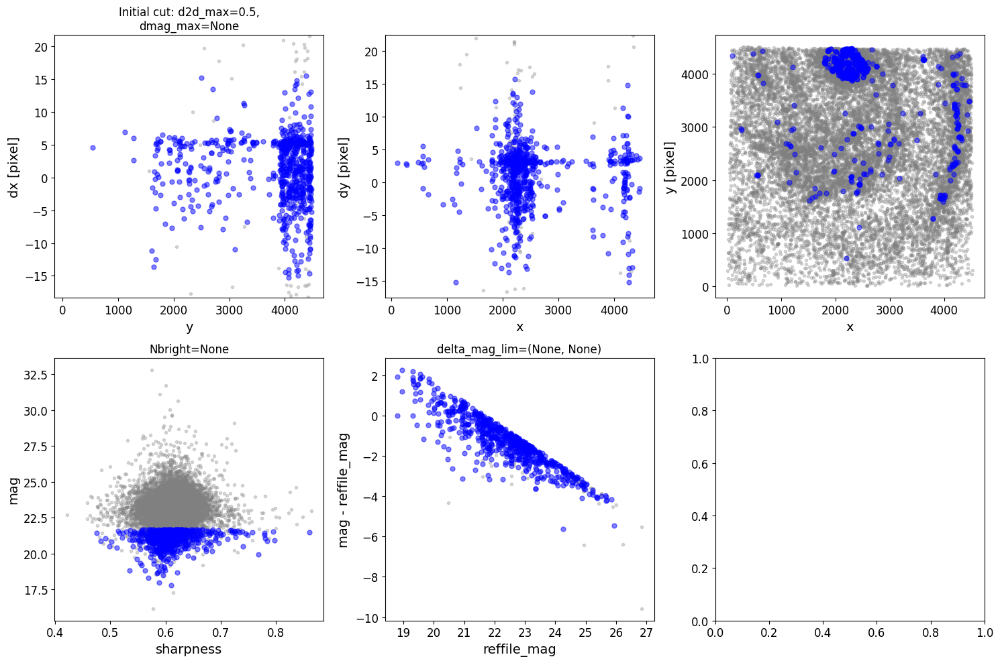

### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000098   0.220605   142.0    508     5.433512   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 6.233512161280703

rough_cut_px=0.8 pixels removes 635 from 800 entries
Keeping 165 out of 165, skippin 0 because of null values in columns d_rot_tmp
median: 5.396397
75.000000 percentile cut: max residual for cut: 0.412627
__tmp_residuals 0.4126273595080221
median: 5.388979
i:00 mean:5.388979(0.019780) stdev:0.218472(0.013929) X2norm:1.00 Nchanged:0 Ngood:123 

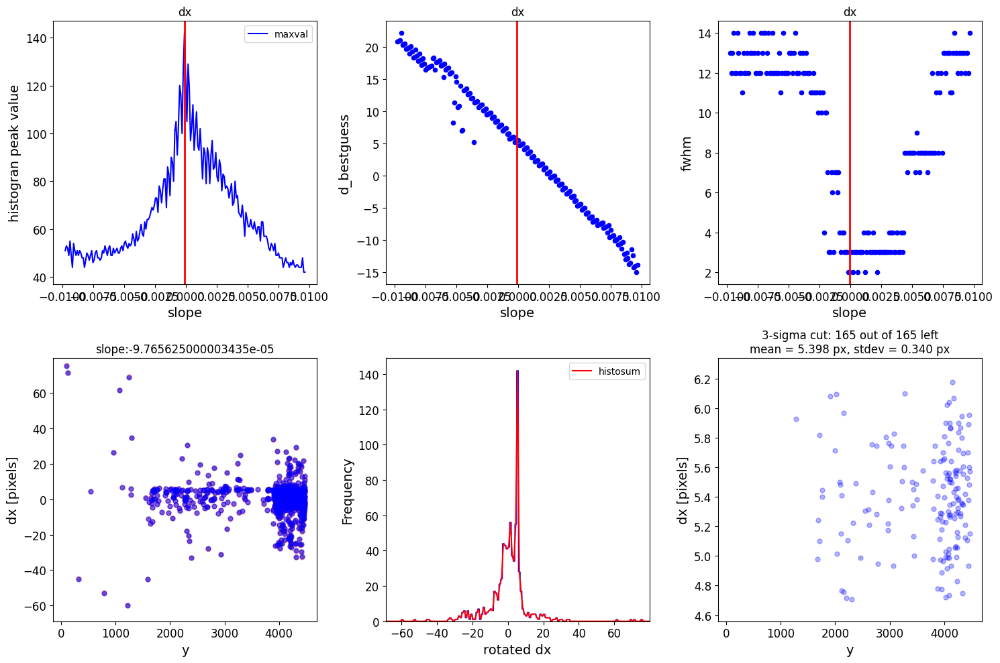

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
   slope  intercept  maxval  index  d_bestguess  fwhm  multimax
0.000195  -0.443262   114.0     18     3.032302   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 3.832301889030025

rough_cut_px=0.8 pixels removes 34 from 165 entries
Keeping 131 out of 131, skippin 0 because of null values in columns d_rot_tmp
median: 3.067032
75.000000 percentile cut: max residual for cut: 0.364781
__tmp_residuals 0.3647807469596762
median: 3.059717
i:00 mean:3.059717(0.018355) stdev:0.180774(0.012912) X2norm:0.99 Nchanged:0 Ngood:98 Ncli

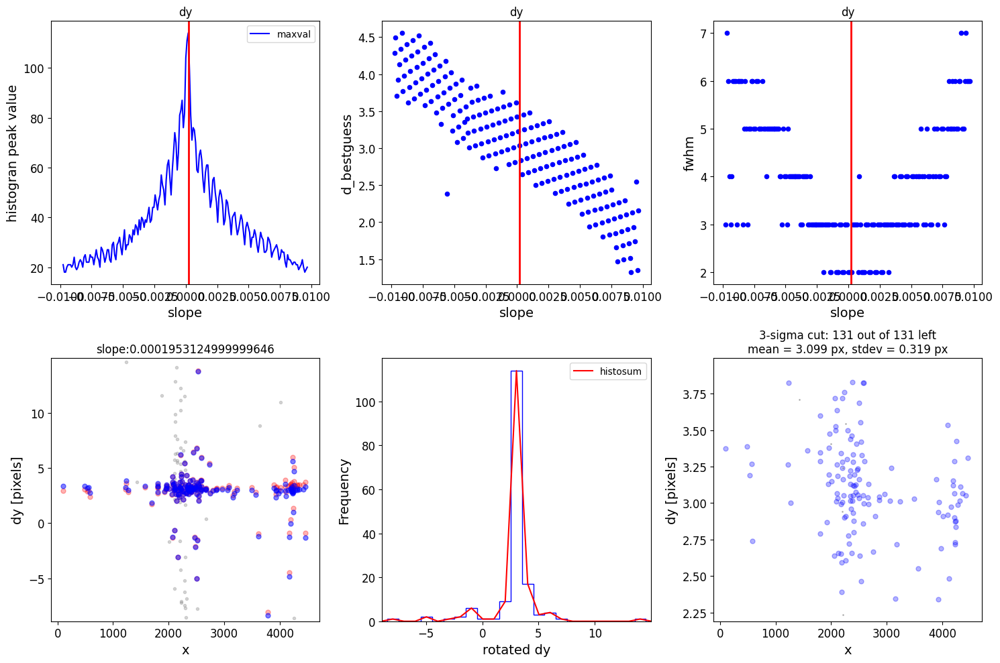

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

dx median of best matched objects of 1st iteration: 5.226153713189888 dy median of best matched objects of 1st iteration: 3.171442954534996
Matching reference catalog data/sn2019ehk/hst_16075_01_wfc3_uvis_f555w_ie9801_drc.corr.phot.txt
Using 800 image objects that are in x_idl=[-28.03,105.70] and y_idl=[-28.56,105.81] range
x 4499
y 4478
Keeping 7572 out of 12824 catalog objects within x=40.0-4499 and y=40.0-4478
Keeping 7572  after removing NaNs from ra/dec
!! Matching 800 image objects to 7572 refcat objects!
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 800 objects
d2d =0.5 CUT using reffile_d2d:
reffile_d2d 0.5
671 left
671 of image photometry objects pass initial cuts #1, 129 cut
### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma

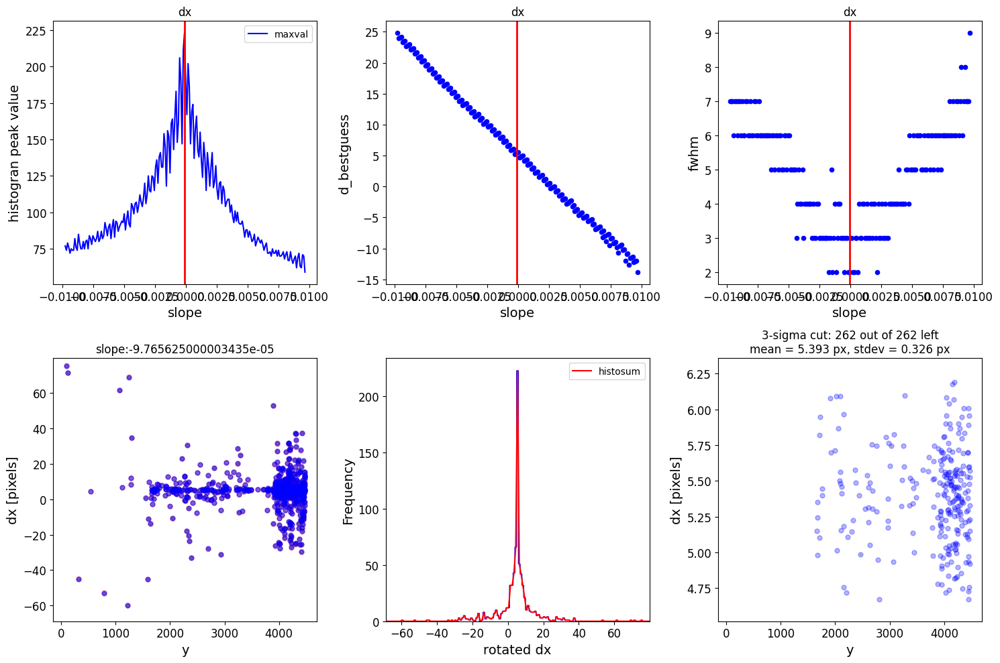

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
   slope  intercept  maxval  index  d_bestguess  fwhm  multimax
0.000195  -0.443262   177.0     18     3.032302   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 3.832301889030025

rough_cut_px=0.8 pixels removes 59 from 262 entries
Keeping 203 out of 203, skippin 0 because of null values in columns d_rot_tmp
median: 3.100870
75.000000 percentile cut: max residual for cut: 0.370873
__tmp_residuals 0.3708728560126151
median: 3.113652
i:00 mean:3.113652(0.014897) stdev:0.183059(0.010499) X2norm:1.00 Nchanged:0 Ngood:152 Ncl

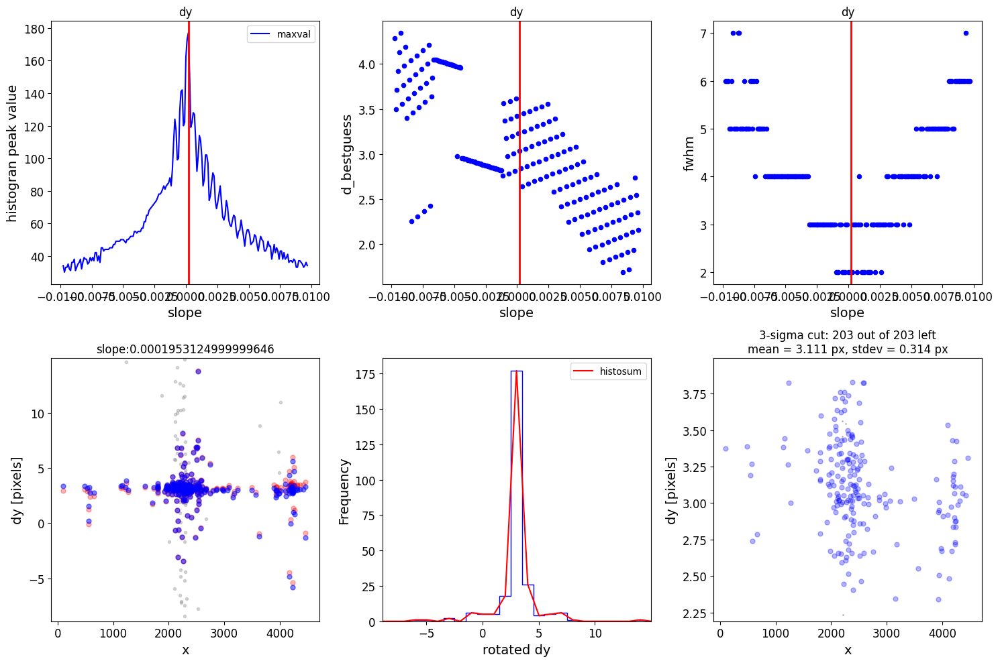

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2025-11-16 00:53:31,172 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.


203 matches are passed to tweakreg rshift fitting
Setting output directory for jw02107-o032_t014_nircam_clear-f200w_jhat.fits file to ./data/sn2019ehk


2025-11-16 00:53:31,478 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(4518, 4539) from jw02107-o032_t014_nircam_clear-f200w_i2d.fits>],).
2025-11-16 00:53:31,479 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_jhat.fits
  output_dir: ./data/sn2019ehk
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 3
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: general
  nclip: 3
  sigma: 3.0
  align_to_gaia: False
  gaia_catalog: GAIADR2
  min_gaia: 3
  save_gaia_catalog: False
  

Fitting tweakreg fitgeometry=general to xy=x,y to ra,dec=reffile_ra,reffile_dec
WCSAXES 2 2
CRPIX1 2295.9397166813824 2295.9397166814
CRPIX2 2240.105846846746 2240.1058468467
PC1_1 -0.269904787463486 -0.27002225740709
PC1_2 -0.9628870160638217 -0.96290252563297
PC2_1 -0.9628870160638217 -0.96286651361222
PC2_2 0.269904787463486 0.27003076187357
CDELT1 8.54138455575943e-06 8.5413845557594e-06
CDELT2 8.54138455575943e-06 8.5413845557594e-06
CUNIT1 deg deg
CUNIT2 deg deg
CRVAL1 185.74548954281457 185.7454504259
CRVAL2 15.817229381931787 15.817192103713
MJD-BEG 59961.45181025463 59961.451810255
MJD-AVG 59961.46896008102 59961.468960081
MJD-END 59961.488098229165 59961.488098229
XPOSURE 1202.5199999999998 1202.52
TELAPSE 1202.5199999999998 1202.52
OBSGEO-X -392625199.82286525 -392625199.82287
OBSGEO-Y 1620561869.359983 1620561869.36
OBSGEO-Z 238509112.98875695 238509112.98876
RADESYS ICRS ICRS
VELOSYS -25738.49 -25738.49


2025-11-16 00:53:31,776 - stpipe.TweakRegStep - INFO - Step TweakRegStep done
2025-11-16 00:53:31,776 - stpipe - INFO - Results used jwst version: 1.18.0


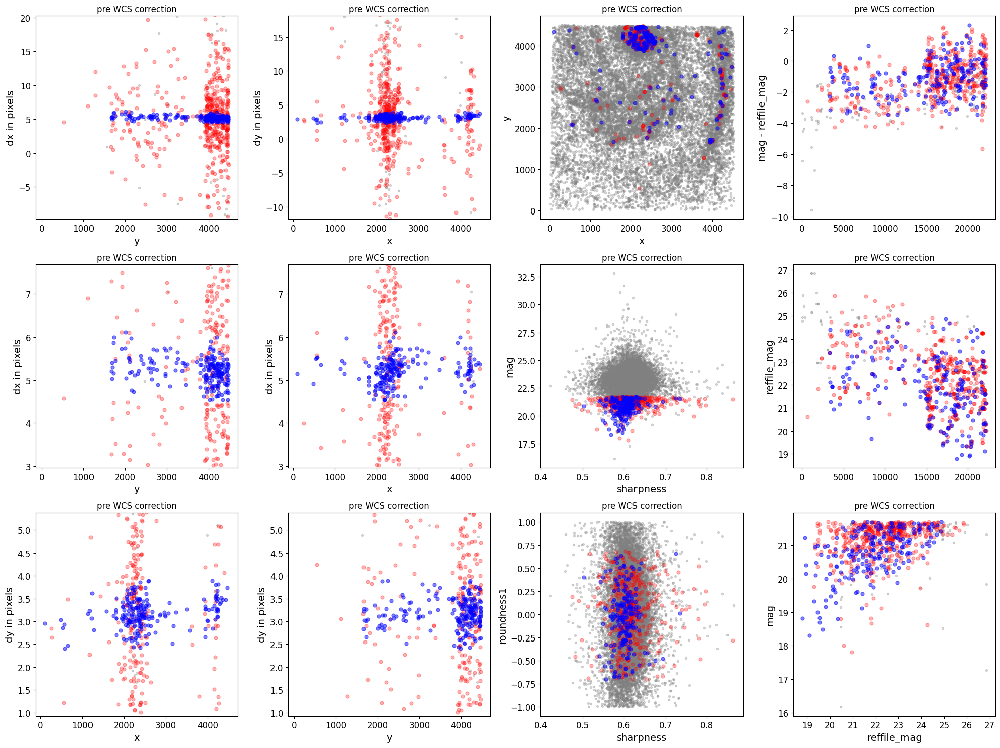

./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_jhat.fits


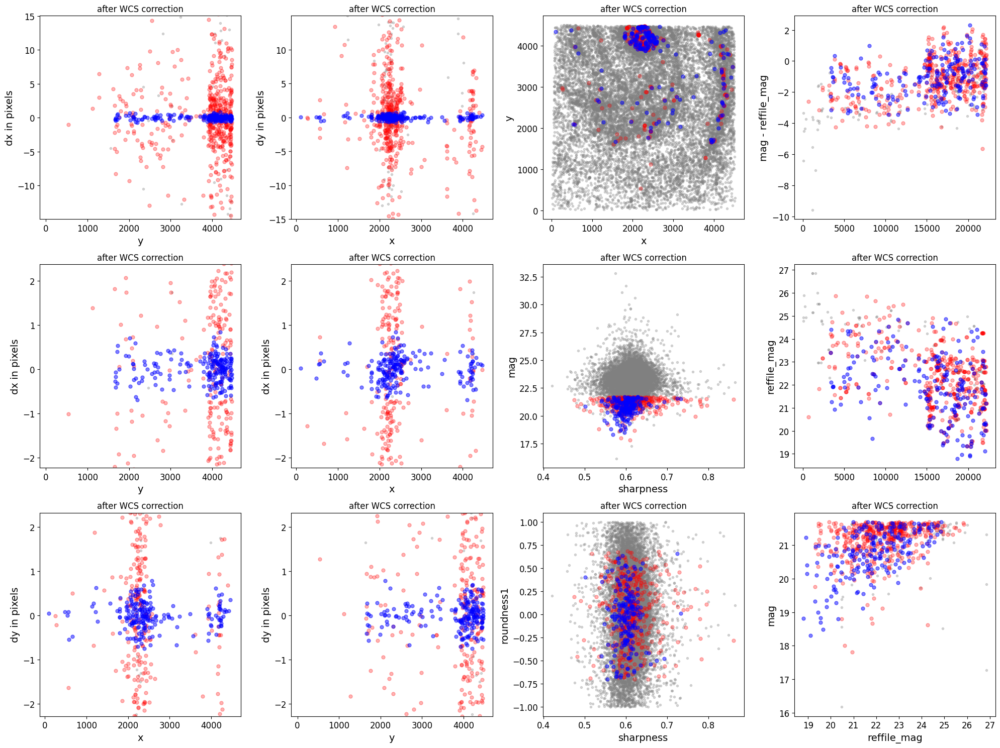

*** Note: close plots to continue!


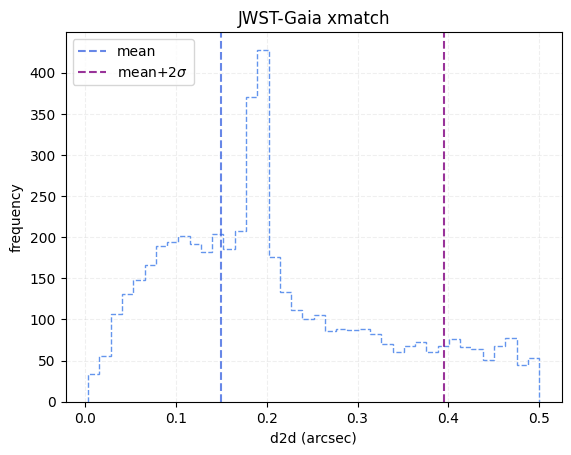

Initial mean dispersion: 149.73610230471078 mas
Initial median dispersion: 145.62499487002856 mas
0 data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_jhat_i2d.phot.txt
No boolean mask filename provided.


2025-11-16 00:53:39,634 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-11-16 00:53:39,825 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-11-16 00:53:39,830 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-11-16 00:53:39,830 - stpipe - INFO - Instrument: NIRCAM
2025-11-16 00:53:39,830 - stpipe - INFO - Detector: MULTIPLE
2025-11-16 00:53:39,830 - stpipe - INFO - Filter: F200W
2025-11-16 00:53:39,831 - stpipe - INFO - Pupil: CLEAR
2025-11-16 00:53:39,831 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004


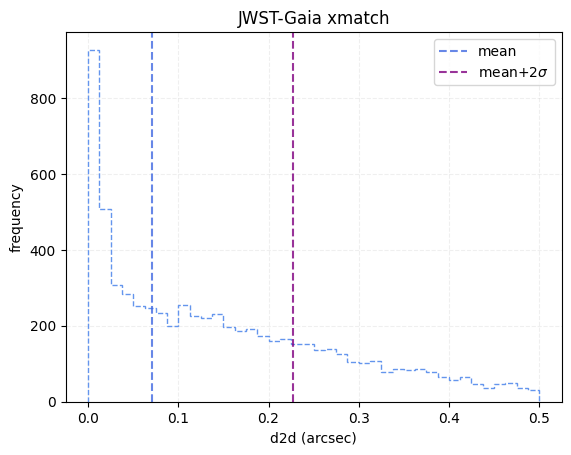

Final mean dispersion: 70.8679157317311 mas
Final median dispersion: 43.81264529781913 mas
telescope set to jwst

### Doing photometry on data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_i2d.fits
True ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w.phot.txt
photometry catalog filename: ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w.phot.txt
photcat ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w.phot.txt already exists, but recreating it since overwrite=True
Instrument: NIRCAM, aperture:NRCB1_FULL
Finding stars --- Detector: MULTIPLE, Filter: F200W
FWHM for the filter F200W: 2.141 px
No boolean mask filename provided.
Background and rms using MMMBackground and MADStdBackgroundRMS: 0.8730862 0.54643893


2025-11-16 00:53:59,843 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-11-16 00:53:59,994 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-11-16 00:53:59,999 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-11-16 00:53:59,999 - stpipe - INFO - Instrument: NIRCAM
2025-11-16 00:54:00,000 - stpipe - INFO - Detector: MULTIPLE
2025-11-16 00:54:00,000 - stpipe - INFO - Filter: F200W
2025-11-16 00:54:00,000 - stpipe - INFO - Pupil: CLEAR
2025-11-16 00:54:00,000 - stpipe - INFO - Subarray: FULL



Number of sources found in the image: 69202
-------------------------------------

radii:[np.float32(3.747)]pixels radius_sky_in:5.677999973297119 radius_sky_out:9.005000114440918  radius_for_mag:[np.float32(3.747)]
Performing aperture photometry for radius r = 3.746999979019165 px
Time Elapsed: 10.475102500000503
66700 objects left after removing entries with NaNs in mag or dmag column
dmag 0.36200000000000004
SNR_min cut: 66323 objects left after removing entries dmag>0.36200000000000004 (SNR<3)
66323 out of 66700 entries remain in photometry table
Saving ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w.phot.txt
########### !!!!!!!!!!  INITIAL CUT on image photometry cat: starting with 66700 objects
dmag_max =0.1 CUT:
dmag 0.1
64563 left
SHARPNESS =(0.3, 0.95) CUT:
sharpness 0.95
64563 left
roundness1=(-0.7, 0.7) CUT:
roundness1 0.7
58857 left
Nbright=800 CUT:
800 left
800 of image photometry objects pass initial cuts #1, 65900 cut
Getting data/sn2019ehk/hst_16075_01_wfc3_uvis

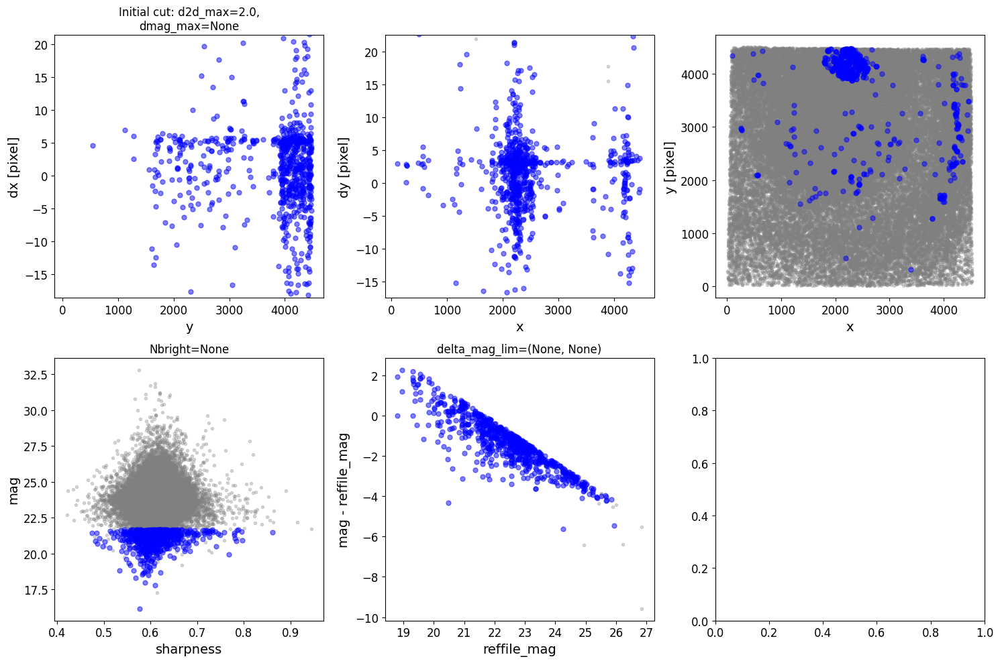

### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000098   0.220605   140.0    508     5.433512   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 6.233512161280703

rough_cut_px=0.8 pixels removes 636 from 800 entries
Keeping 164 out of 164, skippin 0 because of null values in columns d_rot_tmp
median: 5.401043
75.000000 percentile cut: max residual for cut: 0.422079
__tmp_residuals 0.42207938766545183
median: 5.396397
i:00 mean:5.396397(0.020317) stdev:0.224404(0.014307) X2norm:1.00 Nchanged:0 Ngood:123

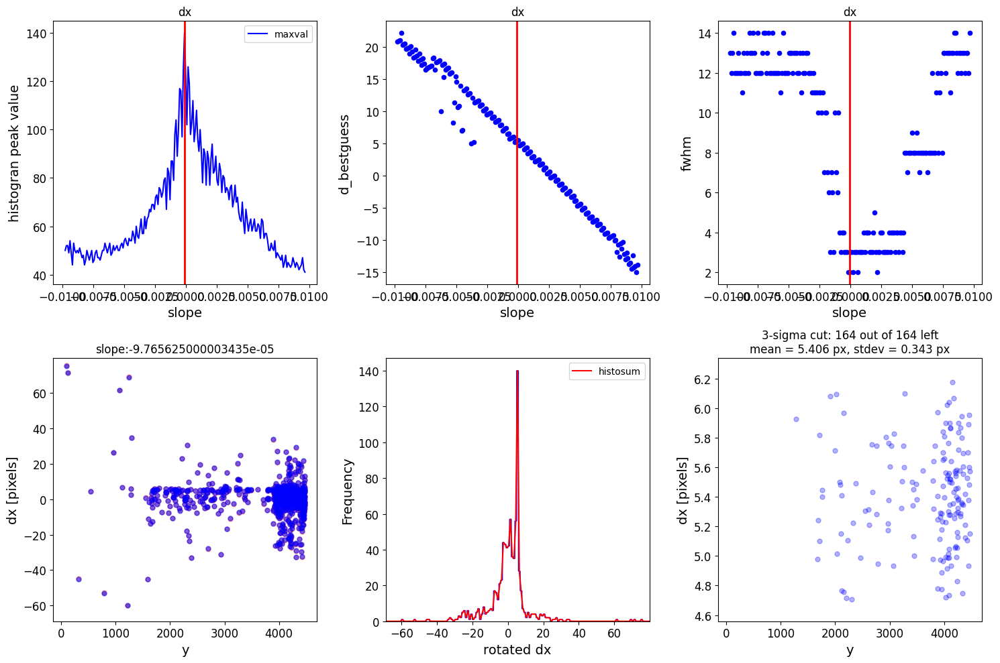

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
   slope  intercept  maxval  index  d_bestguess  fwhm  multimax
0.000195  -0.443262   112.0     18     3.032302   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 3.832301889030025

rough_cut_px=0.8 pixels removes 34 from 164 entries
Keeping 130 out of 130, skippin 0 because of null values in columns d_rot_tmp
median: 3.067336
75.000000 percentile cut: max residual for cut: 0.376799
__tmp_residuals 0.37679904613400184
median: 3.067032
i:00 mean:3.067032(0.018843) stdev:0.184622(0.013255) X2norm:0.99 Nchanged:0 Ngood:97 Ncl

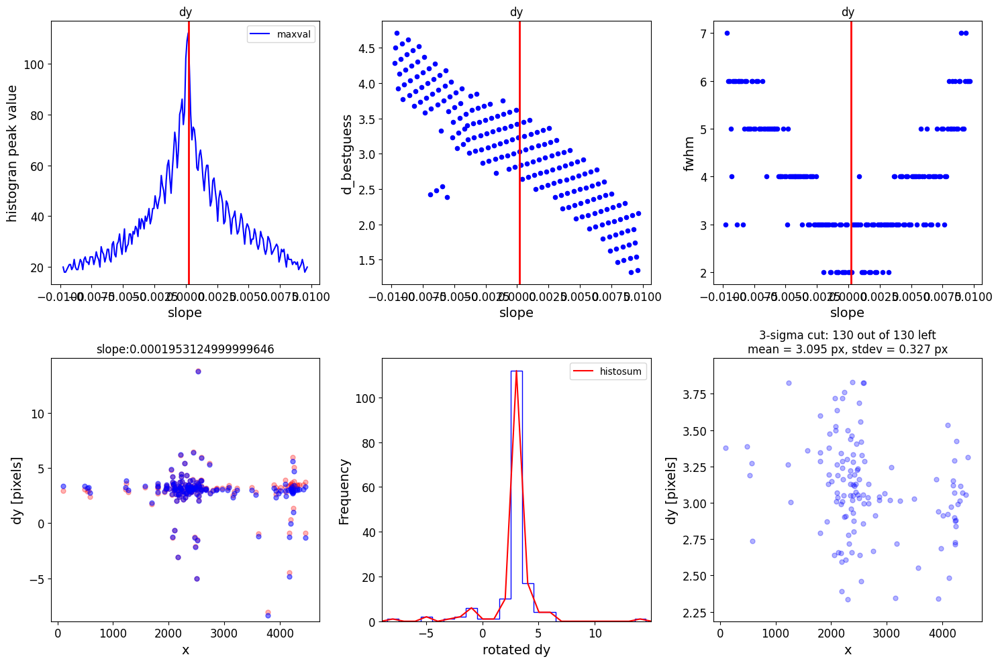

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2025-11-16 00:54:14,931 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.


130 matches are passed to tweakreg rshift fitting


2025-11-16 00:54:15,285 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(4518, 4539) from jw02107-o032_t014_nircam_clear-f200w_i2d.fits>],).
2025-11-16 00:54:15,286 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_jhat.fits
  output_dir: ./data/sn2019ehk
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 3
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: general
  nclip: 3
  sigma: 3.0
  align_to_gaia: False
  gaia_catalog: GAIADR2
  min_gaia: 3
  save_gaia_catalog: False
  

Setting output directory for jw02107-o032_t014_nircam_clear-f200w_jhat.fits file to ./data/sn2019ehk
Fitting tweakreg fitgeometry=general to xy=x,y to ra,dec=reffile_ra,reffile_dec


2025-11-16 00:54:15,471 - stpipe.TweakRegStep - INFO - No matching of sources from 'GROUP ID: jw02107-o032_t014_nircam_clear-f200w_i2d' catalog with sources from the reference 'Unnamed' catalog was requested.
2025-11-16 00:54:15,471 - stpipe.TweakRegStep - INFO - Catalogs are assumed matched with 1-to-1 correspondence.
2025-11-16 00:54:15,472 - stpipe.TweakRegStep - INFO - Found 130 matches for 'GROUP ID: jw02107-o032_t014_nircam_clear-f200w_i2d'...
2025-11-16 00:54:15,472 - stpipe.TweakRegStep - INFO - Performing 'general' fit
2025-11-16 00:54:15,473 - stpipe.TweakRegStep - INFO - Computed 'general' fit for GROUP ID: jw02107-o032_t014_nircam_clear-f200w_i2d:
2025-11-16 00:54:15,473 - stpipe.TweakRegStep - INFO - XSH: 5.54111  YSH: 2.6982    PROPER ROT: -0.00631768    
2025-11-16 00:54:15,473 - stpipe.TweakRegStep - INFO - <ROT>: -0.00631768  SKEW: 0.00102673    ROT_X: -0.00683105  ROT_Y: -0.00580432
2025-11-16 00:54:15,474 - stpipe.TweakRegStep - INFO - <SCALE>: 1.00003  SCALE_X: 1.00

WCSAXES 2 2
CRPIX1 2295.9397166813824 2295.9397166814
CRPIX2 2240.105846846746 2240.1058468467
PC1_1 -0.269904787463486 -0.2700248183579
PC1_2 -0.9628870160638217 -0.96290046998088
PC2_1 -0.9628870160638217 -0.96287417943653
PC2_2 0.269904787463486 0.2700135791644
CDELT1 8.54138455575943e-06 8.5413845557594e-06
CDELT2 8.54138455575943e-06 8.5413845557594e-06
CUNIT1 deg deg
CUNIT2 deg deg
CRVAL1 185.74548954281457 185.74545048603
CRVAL2 15.817229381931787 15.817192366681
MJD-BEG 59961.45181025463 59961.451810255
MJD-AVG 59961.46896008102 59961.468960081
MJD-END 59961.488098229165 59961.488098229
XPOSURE 1202.5199999999998 1202.52
TELAPSE 1202.5199999999998 1202.52
OBSGEO-X -392625199.82286525 -392625199.82287
OBSGEO-Y 1620561869.359983 1620561869.36
OBSGEO-Z 238509112.98875695 238509112.98876
RADESYS ICRS ICRS
VELOSYS -25738.49 -25738.49


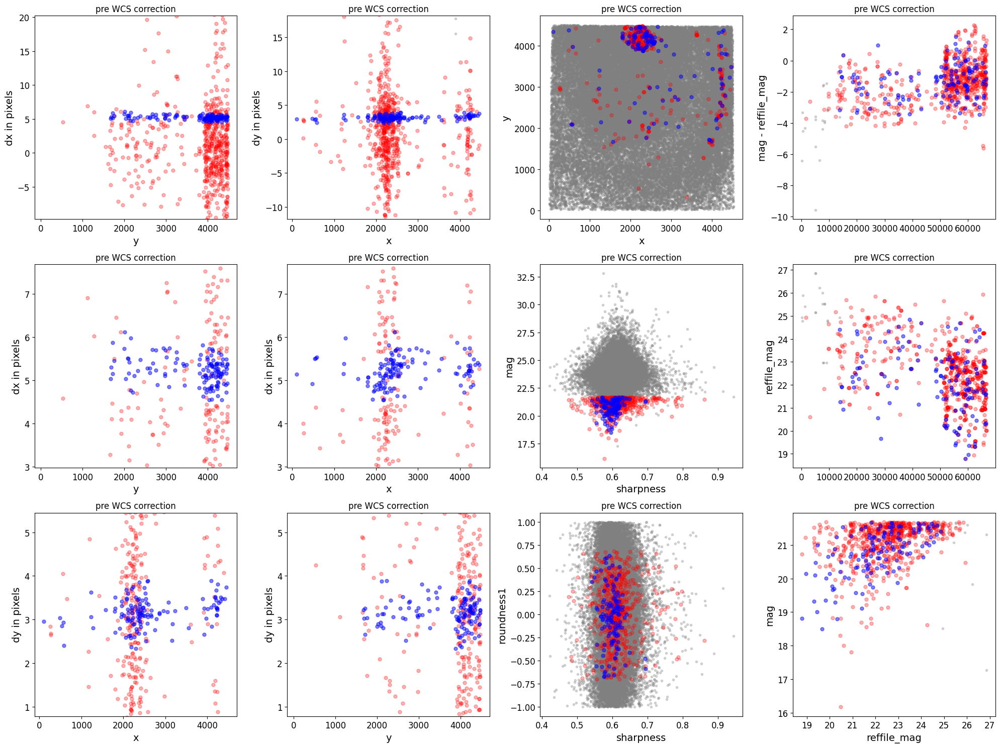

./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_jhat.fits


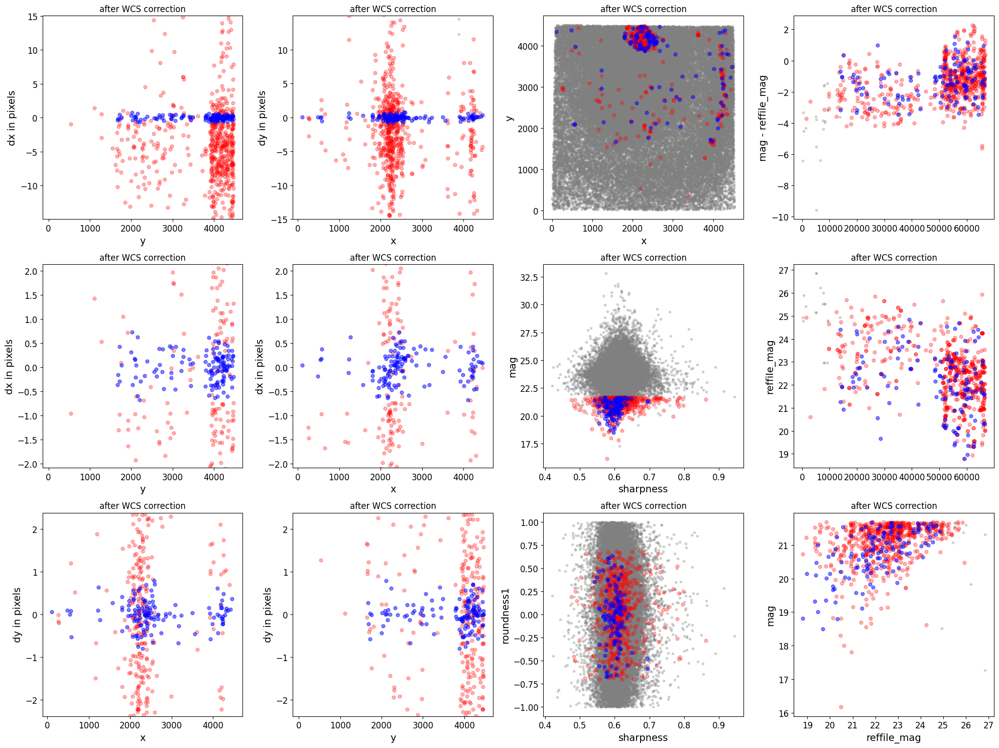

*** Note: close plots to continue!


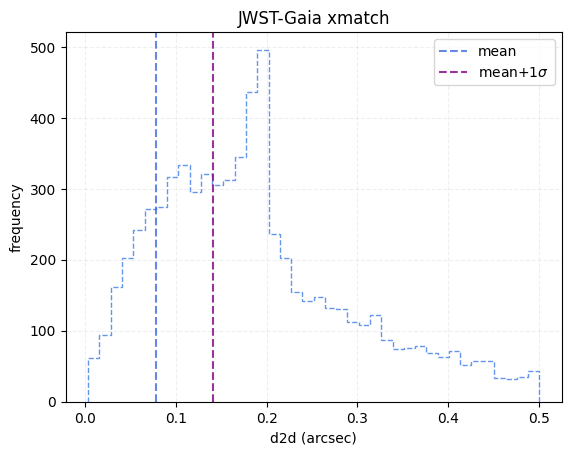

Initial mean dispersion: 78.47805844857095 mas
Initial median dispersion: 76.3257271192268 mas
0 data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_jhat_i2d.phot.txt
No boolean mask filename provided.


2025-11-16 00:54:23,946 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-11-16 00:54:24,264 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-11-16 00:54:24,270 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-11-16 00:54:24,270 - stpipe - INFO - Instrument: NIRCAM
2025-11-16 00:54:24,271 - stpipe - INFO - Detector: MULTIPLE
2025-11-16 00:54:24,271 - stpipe - INFO - Filter: F200W
2025-11-16 00:54:24,271 - stpipe - INFO - Pupil: CLEAR
2025-11-16 00:54:24,271 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004


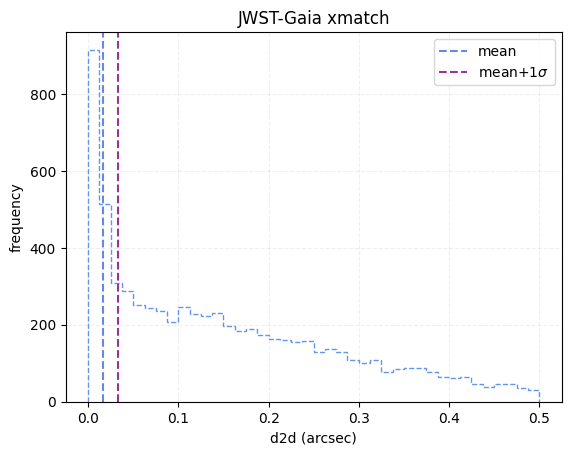

Final mean dispersion: 16.115852415103827 mas
Final median dispersion: 11.271596467922848 mas
Final JWST dispersion for data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_i2d.fits: 16.115852415103827 mas


(0, 0)

In [10]:
jwst123.align_jwst_image(align_image=align_image, outdir=outdir, gaia=False, 
                         plot=True, verbose=True, photfilename=photfilename, Nbright=800)

In [22]:
outdir = 'data/sn2019ehk/'
# image = os.path.join(outdir, 'jw02107043001_02101_00001_nrcb1_cal.fits')
image = os.path.join(outdir, 'jw02107-o032_t014_nircam_clear-f200w_copy_i2d.fits')
ref_image = os.path.join(outdir, 'jw02107043001_06101_00001_nrcb1_cal.fits')
_, photfilename = jwst123.jwst_phot(ref_image)

0 data/sn2019ehk/jw02107043001_06101_00001_nrcb1_cal.phot.txt
No boolean mask filename provided.


2025-11-16 18:20:02,381 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-11-16 18:20:02,441 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-11-16 18:20:02,446 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-11-16 18:20:02,446 - stpipe - INFO - Instrument: NIRCAM
2025-11-16 18:20:02,446 - stpipe - INFO - Detector: NRCB1
2025-11-16 18:20:02,447 - stpipe - INFO - Filter: F200W
2025-11-16 18:20:02,447 - stpipe - INFO - Pupil: CLEAR
2025-11-16 18:20:02,447 - stpipe - INFO - Subarray: FULL
2025-11-16 18:20:02,457 - stpipe - WARNING - model.meta.resample.pixel_scale_ratio was not found. Assuming the native detector pixel scale (i.e., pixel_scale_ratio = 1)


dmag 0.36200000000000004


Aligning jw02107-o032_t014_nircam_clear-f200w_copy_i2d.fits to Gaia
telescope set to jwst

### Doing photometry on data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_copy_i2d.fits
True ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy.phot.txt
photometry catalog filename: ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy.phot.txt
photcat ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy.phot.txt already exists, but recreating it since overwrite=True
Instrument: NIRCAM, aperture:NRCB1_FULL
Finding stars --- Detector: MULTIPLE, Filter: F200W
FWHM for the filter F200W: 2.141 px
No boolean mask filename provided.
Background and rms using MMMBackground and MADStdBackgroundRMS: 0.8730862 0.54643893


2025-11-16 18:21:25,486 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-11-16 18:21:25,637 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-11-16 18:21:25,641 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-11-16 18:21:25,642 - stpipe - INFO - Instrument: NIRCAM
2025-11-16 18:21:25,642 - stpipe - INFO - Detector: MULTIPLE
2025-11-16 18:21:25,642 - stpipe - INFO - Filter: F200W
2025-11-16 18:21:25,642 - stpipe - INFO - Pupil: CLEAR
2025-11-16 18:21:25,642 - stpipe - INFO - Subarray: FULL



Number of sources found in the image: 23283
-------------------------------------

radii:[np.float32(3.747)]pixels radius_sky_in:5.677999973297119 radius_sky_out:9.005000114440918  radius_for_mag:[np.float32(3.747)]
Performing aperture photometry for radius r = 3.746999979019165 px
Time Elapsed: 3.7944413330114912
22245 objects left after removing entries with NaNs in mag or dmag column
dmag 0.2172
SNR_min cut: 22040 objects left after removing entries dmag>0.2172 (SNR<5)
22040 out of 22245 entries remain in photometry table
Saving ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy.phot.txt
########### !!!!!!!!!!  INITIAL CUT on image photometry cat: starting with 22245 objects
dmag_max =0.1 CUT:
dmag 0.1
21759 left
SHARPNESS =(0.3, 0.95) CUT:
sharpness 0.95
21759 left
roundness1=(-0.7, 0.7) CUT:
roundness1 0.7
20154 left
objmag_lim=(15, 25) CUT:
mag 25
20050 left
20050 of image photometry objects pass initial cuts #1, 2195 cut
Getting Gaia and matching it: ra=185.74539138633

2025-11-16 18:21:39,804 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of stars: 56
### Applying proper motion correction to epoch mjd=59961.46896008102
Number of stars after removing nan's: 14
########### !!!!!!!!!!  INITIAL CUT on reference catalog: starting with 14 objects
14 of image photometry objects pass initial cuts #1, 0 cut
Matching reference catalog Gaia
Using 20050 image objects that are in x_idl=[-31.17,107.10] and y_idl=[-31.09,107.41] range
x 4499
y 4478
Keeping 7 out of 14 catalog objects within x=40.0-4499 and y=40.0-4478
Keeping 7  after removing NaNs from ra/dec
!! Matching 20050 image objects to 7 refcat objects!
Saving refcat file into ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy.refcat.txt
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 20050 objects
d2d =0.5 CUT using gaia_d2d:
gaia_d2d 0.5
26 left
26 of image photometry objects pass initial cuts #1, 20024 cut
dx median: 2.863963938629695
dy median: 3.7275013444045157
*** Note: close plot to co

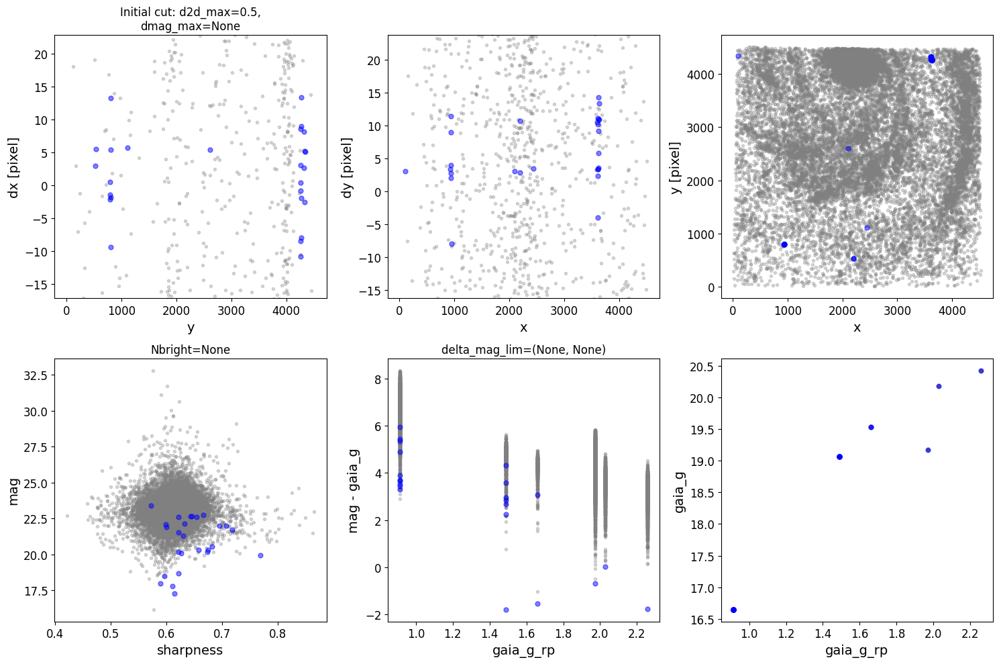

### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
   slope  intercept  maxval  index  d_bestguess  fwhm  multimax
0.005176  -11.69209    29.0   1495  -569.208466   6.0     False
Setting rough_cut_px=15.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp -568.4084656234334

rough_cut_px=0.8 pixels removes 20010 from 20050 entries
Keeping 40 out of 40, skippin 0 because of null values in columns d_rot_tmp
median: -569.175524
75.000000 percentile cut: max residual for cut: 0.509705
__tmp_residuals 0.5097050427077647
median: -569.245185
i:00 mean:-569.245185(0.061538) stdev:0.331392(0.042783) X2norm:0.98 Nchanged:0

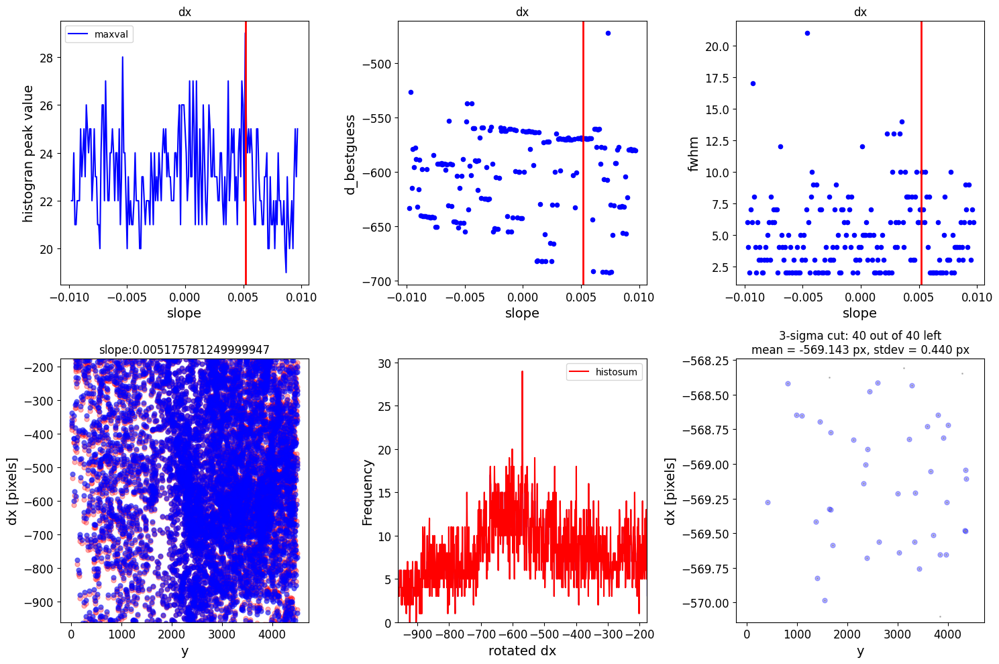

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.009766  22.163086     2.0   1403   488.131025   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 488.93102475983363

rough_cut_px=0.8 pixels removes 38 from 40 entries
Keeping 2 out of 2, skippin 0 because of null values in columns d_rot_tmp
median: 488.332317
i:00 mean:488.332317(0.475510) stdev:0.475510(0.237755) X2norm:0.64 Nchanged:0 Ngood:2 Nclip:0

mean: 488.332317
i:01 mean:488.332317(0.379402) stdev:0.379402(0.189701) X2norm:1.00 Nchanged:0 Ngood:2

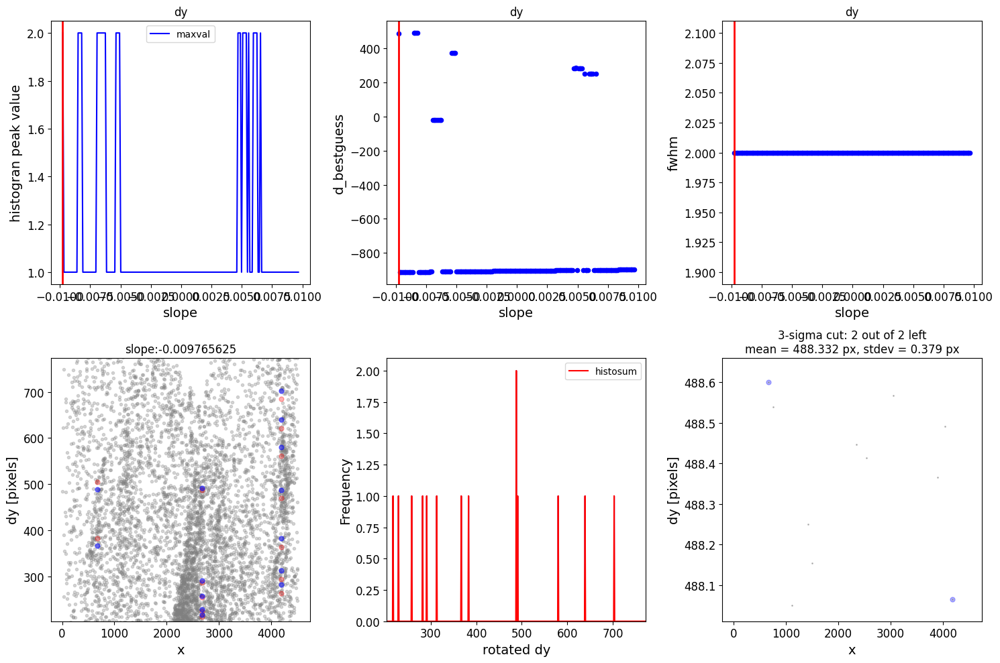

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

dx median of best matched objects of 1st iteration: -561.0630381757196 dy median of best matched objects of 1st iteration: 486.79491981758815
Matching reference catalog Gaia
Using 20050 image objects that are in x_idl=[-31.17,107.10] and y_idl=[-31.09,107.41] range
x 4499
y 4478
Keeping 7 out of 14 catalog objects within x=40.0-4499 and y=40.0-4478
Keeping 7  after removing NaNs from ra/dec
!! Matching 20050 image objects to 7 refcat objects!
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 20050 objects
d2d =0.5 CUT using gaia_d2d:
gaia_d2d 0.5
18 left
18 of image photometry objects pass initial cuts #1, 20032 cut
### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
   slope  

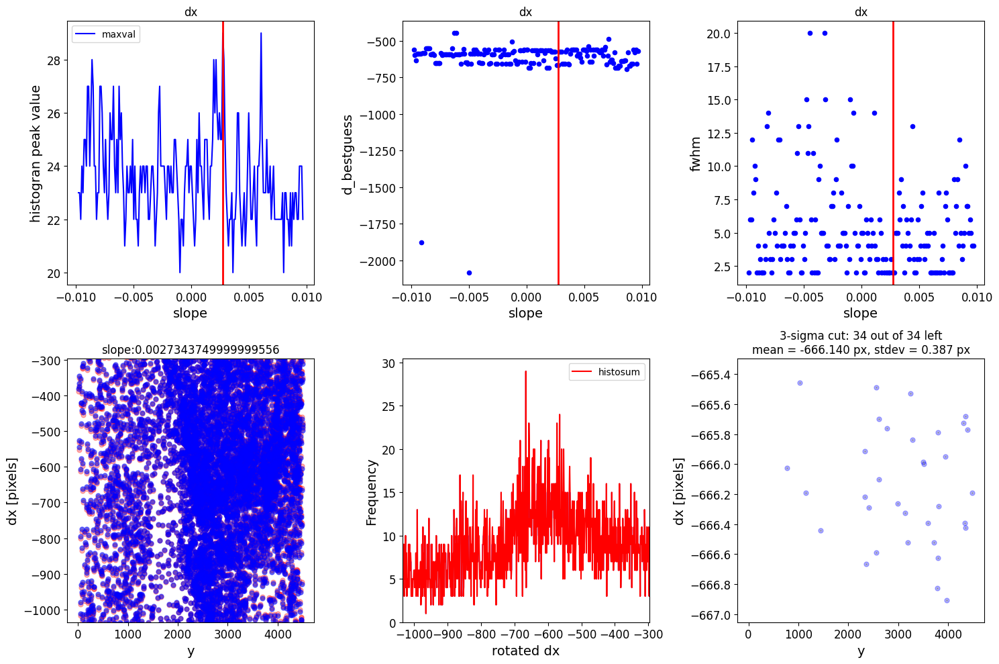

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.008496  19.281885     2.0    618   -24.079972   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp -23.279972224306743

rough_cut_px=0.8 pixels removes 32 from 34 entries
Keeping 2 out of 2, skippin 0 because of null values in columns d_rot_tmp
median: -24.409416
i:00 mean:-24.409416(0.216900) stdev:0.216900(0.108450) X2norm:0.64 Nchanged:0 Ngood:2 Nclip:0

mean: -24.409416
i:01 mean:-24.409416(0.173061) stdev:0.173061(0.086531) X2norm:1.00 Nchanged:0 Ngood:

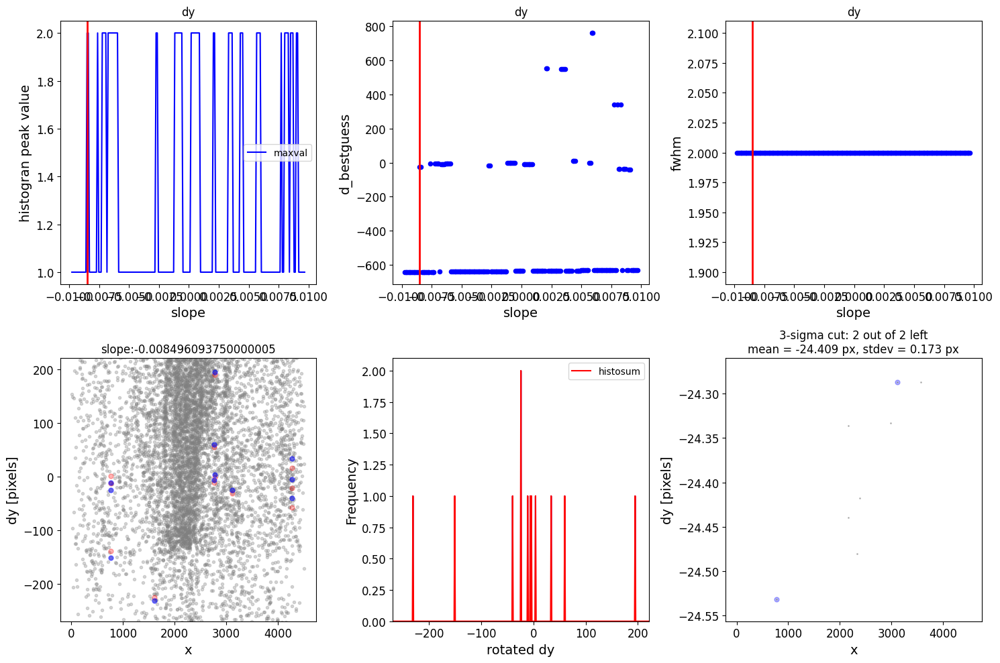

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2025-11-16 18:21:42,817 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.


2 matches are passed to tweakreg rshift fitting
Setting output directory for jw02107-o032_t014_nircam_clear-f200w_copy_jhat.fits file to ./data/sn2019ehk
Fitting tweakreg fitgeometry=general to xy=x,y to ra,dec=gaia_ra,gaia_dec


2025-11-16 18:21:43,267 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(4518, 4539) from jw02107-o032_t014_nircam_clear-f200w_copy_i2d.fits>],).
2025-11-16 18:21:43,269 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_copy_jhat.fits
  output_dir: ./data/sn2019ehk
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 3
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: general
  nclip: 3
  sigma: 3.0
  align_to_gaia: False
  gaia_catalog: GAIADR2
  min_gaia: 3
  save_gaia_catalog

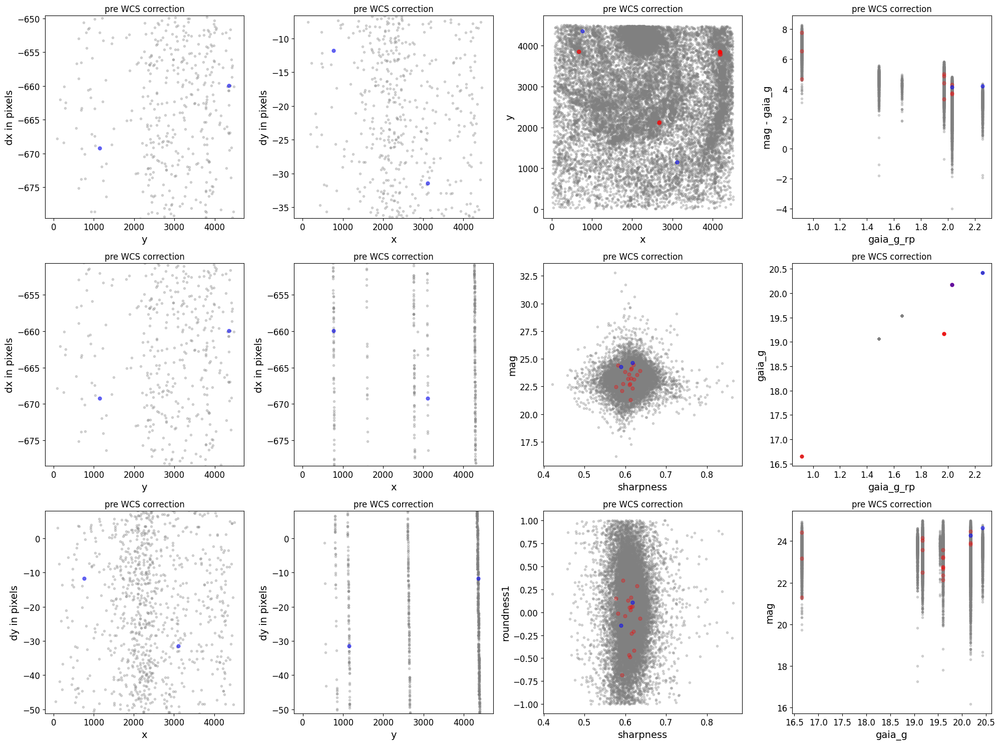

./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy_jhat.fits


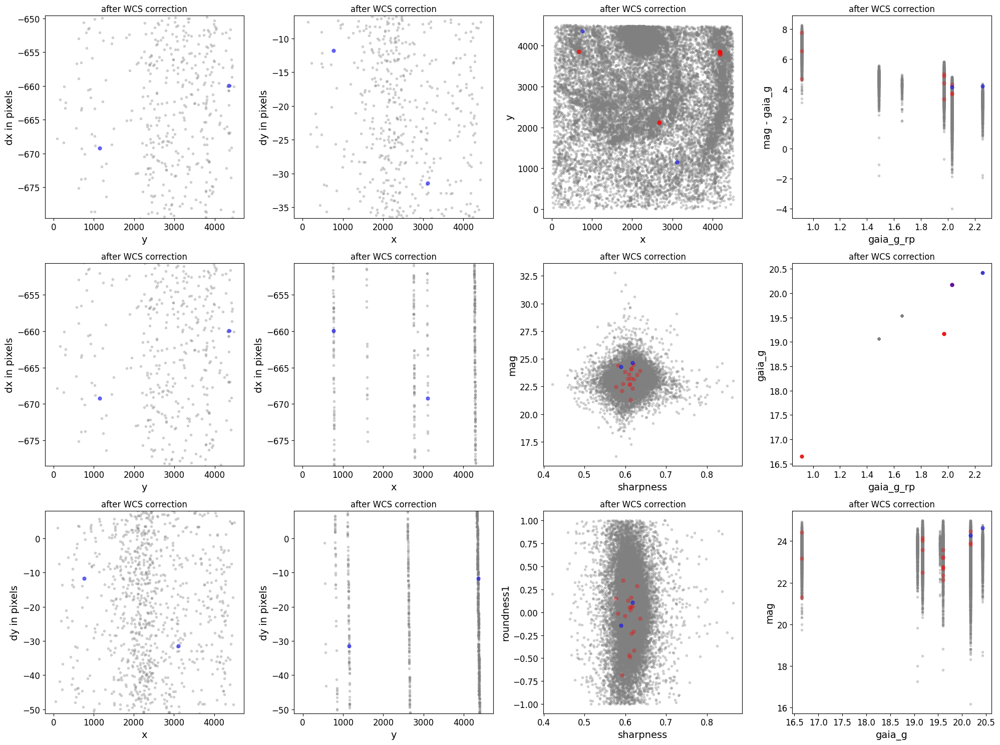

*** Note: close plots to continue!


2025-11-16 18:21:47,152 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of Gaia stars: 64


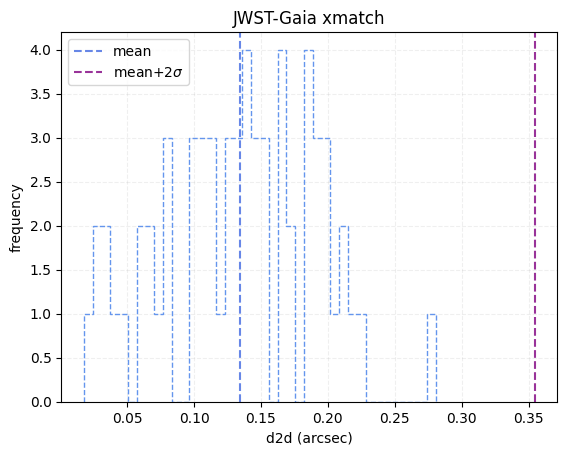

Initial mean dispersion: 134.528771052173 mas
Initial median dispersion: 131.3065312312426 mas
0 data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_copy_jhat_i2d.phot.txt
No boolean mask filename provided.


2025-11-16 18:21:53,889 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-11-16 18:21:54,034 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-11-16 18:21:54,038 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-11-16 18:21:54,038 - stpipe - INFO - Instrument: NIRCAM
2025-11-16 18:21:54,039 - stpipe - INFO - Detector: MULTIPLE
2025-11-16 18:21:54,039 - stpipe - INFO - Filter: F200W
2025-11-16 18:21:54,039 - stpipe - INFO - Pupil: CLEAR
2025-11-16 18:21:54,039 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004


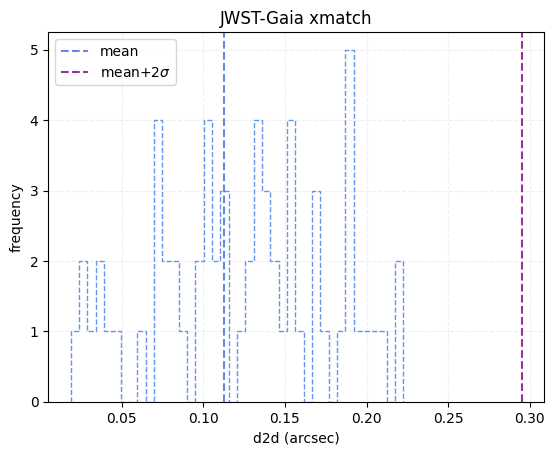

Final mean dispersion: 112.84761704820887 mas
Final median dispersion: 108.66398919267239 mas
telescope set to jwst

### Doing photometry on data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_copy_i2d.fits
True ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy.phot.txt
photometry catalog filename: ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy.phot.txt
photcat ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy.phot.txt already exists, but recreating it since overwrite=True
Instrument: NIRCAM, aperture:NRCB1_FULL
Finding stars --- Detector: MULTIPLE, Filter: F200W
FWHM for the filter F200W: 2.141 px
No boolean mask filename provided.
Background and rms using MMMBackground and MADStdBackgroundRMS: 0.8730862 0.54643893


2025-11-16 18:22:14,207 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-11-16 18:22:14,361 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-11-16 18:22:14,365 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-11-16 18:22:14,366 - stpipe - INFO - Instrument: NIRCAM
2025-11-16 18:22:14,366 - stpipe - INFO - Detector: MULTIPLE
2025-11-16 18:22:14,366 - stpipe - INFO - Filter: F200W
2025-11-16 18:22:14,366 - stpipe - INFO - Pupil: CLEAR
2025-11-16 18:22:14,366 - stpipe - INFO - Subarray: FULL



Number of sources found in the image: 69202
-------------------------------------

radii:[np.float32(3.747)]pixels radius_sky_in:5.677999973297119 radius_sky_out:9.005000114440918  radius_for_mag:[np.float32(3.747)]
Performing aperture photometry for radius r = 3.746999979019165 px
Time Elapsed: 10.256461167009547
66700 objects left after removing entries with NaNs in mag or dmag column
dmag 0.36200000000000004
SNR_min cut: 66323 objects left after removing entries dmag>0.36200000000000004 (SNR<3)
66323 out of 66700 entries remain in photometry table
Saving ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy.phot.txt
########### !!!!!!!!!!  INITIAL CUT on image photometry cat: starting with 66700 objects
dmag_max =0.1 CUT:
dmag 0.1
64563 left
SHARPNESS =(0.3, 0.95) CUT:
sharpness 0.95
64563 left
roundness1=(-0.7, 0.7) CUT:
roundness1 0.7
58857 left
58857 of image photometry objects pass initial cuts #1, 7843 cut
Getting Gaia and matching it: ra=185.7453913863315 dec=15.8174903

2025-11-16 18:22:29,570 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of stars: 56
### Applying proper motion correction to epoch mjd=59961.46896008102
Number of stars after removing nan's: 14
########### !!!!!!!!!!  INITIAL CUT on reference catalog: starting with 14 objects
14 of image photometry objects pass initial cuts #1, 0 cut
Matching reference catalog Gaia
Using 58857 image objects that are in x_idl=[-31.20,107.44] and y_idl=[-31.09,107.56] range
x 4499
y 4478
Keeping 7 out of 14 catalog objects within x=40.0-4499 and y=40.0-4478
Keeping 7  after removing NaNs from ra/dec
!! Matching 58857 image objects to 7 refcat objects!
Saving refcat file into ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy.refcat.txt
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 58857 objects
d2d =2.0 CUT using gaia_d2d:
gaia_d2d 2.0
244 left
244 of image photometry objects pass initial cuts #1, 58613 cut
dx median: -0.44627542764533246
dy median: 2.9547150469491044
*** Note: close plot 

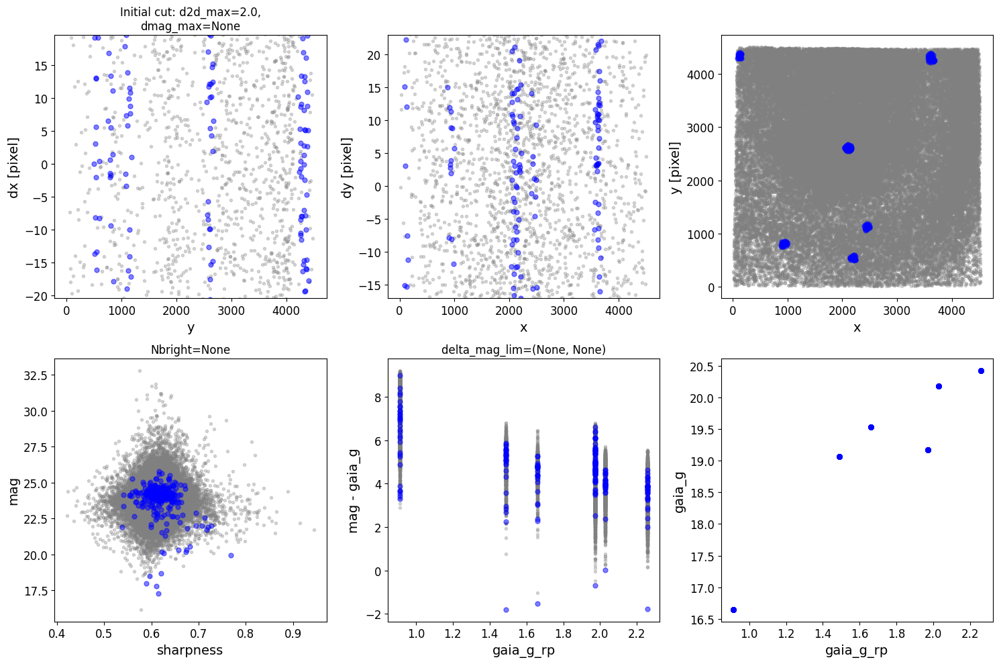

### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
   slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.00791  17.869043    57.0   1509  -589.178186  10.0     False
Setting rough_cut_px=25.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp -588.378186427931

rough_cut_px=0.8 pixels removes 58790 from 58857 entries
Keeping 67 out of 67, skippin 0 because of null values in columns d_rot_tmp
median: -589.103931
75.000000 percentile cut: max residual for cut: 0.404396
__tmp_residuals 0.4043959257122083
median: -589.103218
i:00 mean:-589.103218(0.030692) stdev:0.214845(0.021485) X2norm:0.99 Nchanged:0 

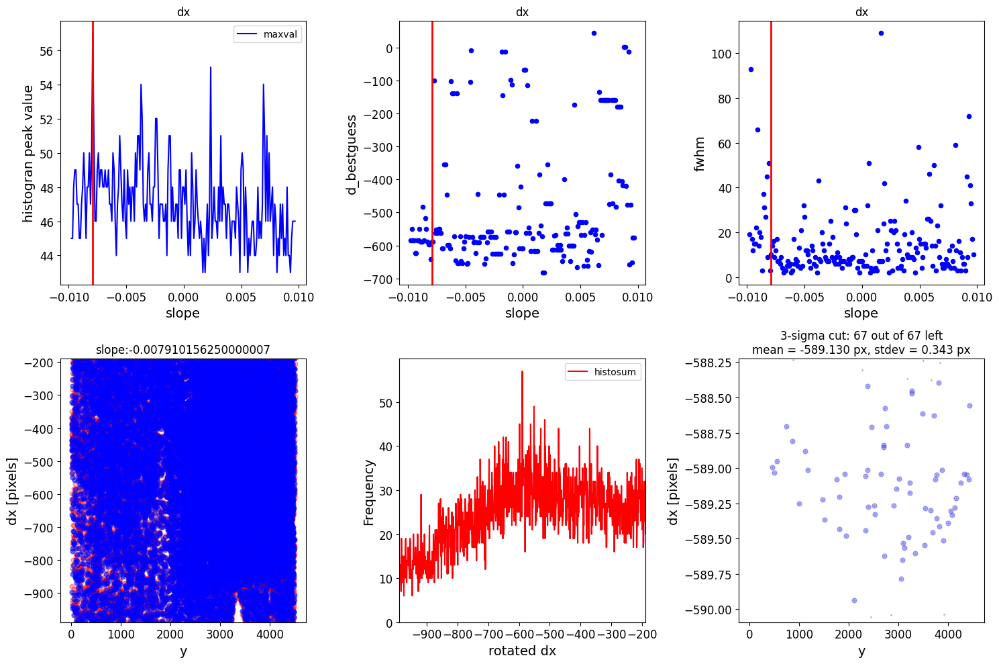

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.005078  11.524805     3.0    840   -93.238207   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp -92.43820717225363

rough_cut_px=0.8 pixels removes 64 from 67 entries
Keeping 3 out of 3, skippin 0 because of null values in columns d_rot_tmp
median: -93.220088
i:00 mean:-93.220088(0.332493) stdev:0.470215(0.191965) X2norm:0.79 Nchanged:0 Ngood:3 Nclip:0

mean: -93.200499
i:01 mean:-93.200499(0.294175) stdev:0.416026(0.169842) X2norm:1.00 Nchanged:0 Ngood:3

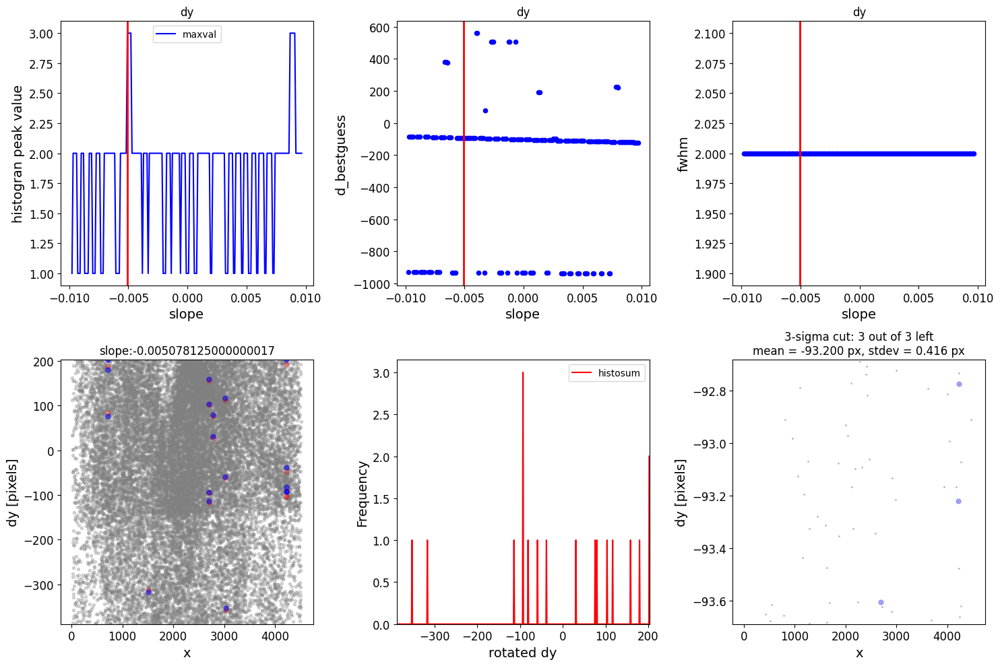

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2025-11-16 18:22:31,773 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.


3 matches are passed to tweakreg rshift fitting
Setting output directory for jw02107-o032_t014_nircam_clear-f200w_copy_jhat.fits file to ./data/sn2019ehk
Fitting tweakreg fitgeometry=general to xy=x,y to ra,dec=gaia_ra,gaia_dec


2025-11-16 18:22:32,200 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(4518, 4539) from jw02107-o032_t014_nircam_clear-f200w_copy_i2d.fits>],).
2025-11-16 18:22:32,202 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_copy_jhat.fits
  output_dir: ./data/sn2019ehk
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 3
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: general
  nclip: 3
  sigma: 3.0
  align_to_gaia: False
  gaia_catalog: GAIADR2
  min_gaia: 3
  save_gaia_catalog

WCSAXES 2 2
CRPIX1 2295.9397166813824 2295.9397166814
CRPIX2 2240.105846846746 2240.1058468467
PC1_1 -0.269904787463486 -0.2701969120386
PC1_2 -0.9628870160638217 -0.95645128708107
PC2_1 -0.9628870160638217 -0.95448383977875
PC2_2 0.269904787463486 0.2688232867737
CDELT1 8.54138455575943e-06 8.5413845557594e-06
CDELT2 8.54138455575943e-06 8.5413845557594e-06
CUNIT1 deg deg
CUNIT2 deg deg
CRVAL1 185.74548954281457 185.74770209981
CRVAL2 15.817229381931787 15.821855877829
MJD-BEG 59961.45181025463 59961.451810255
MJD-AVG 59961.46896008102 59961.468960081
MJD-END 59961.488098229165 59961.488098229
XPOSURE 1202.5199999999998 1202.52
TELAPSE 1202.5199999999998 1202.52
OBSGEO-X -392625199.82286525 -392625199.82287
OBSGEO-Y 1620561869.359983 1620561869.36
OBSGEO-Z 238509112.98875695 238509112.98876
RADESYS ICRS ICRS
VELOSYS -25738.49 -25738.49


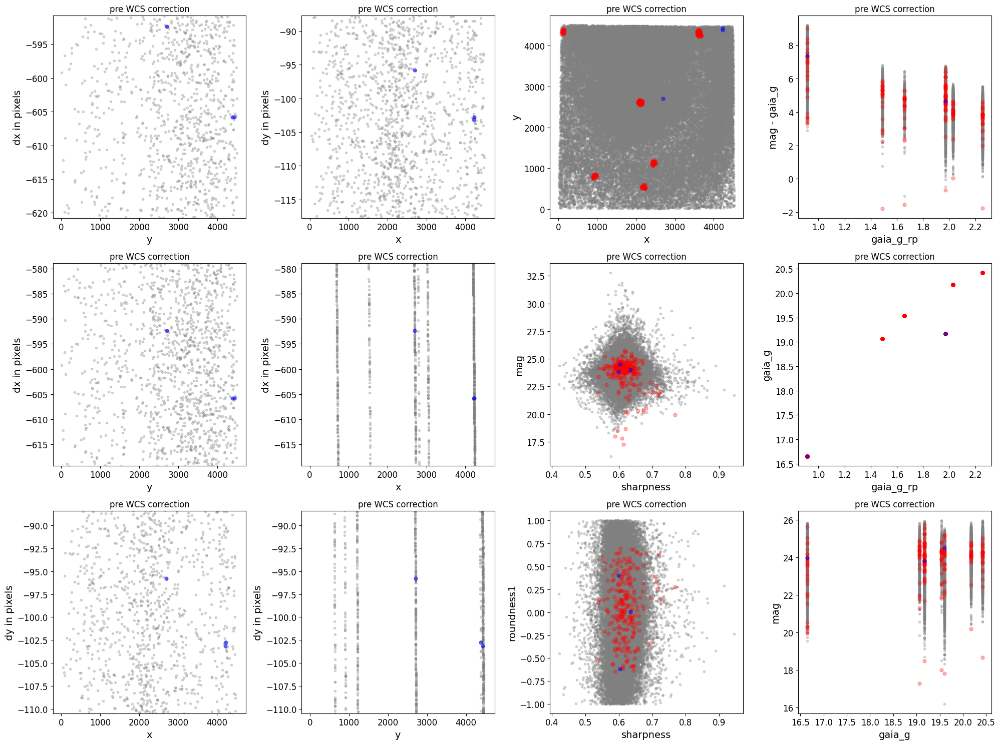

./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy_jhat.fits


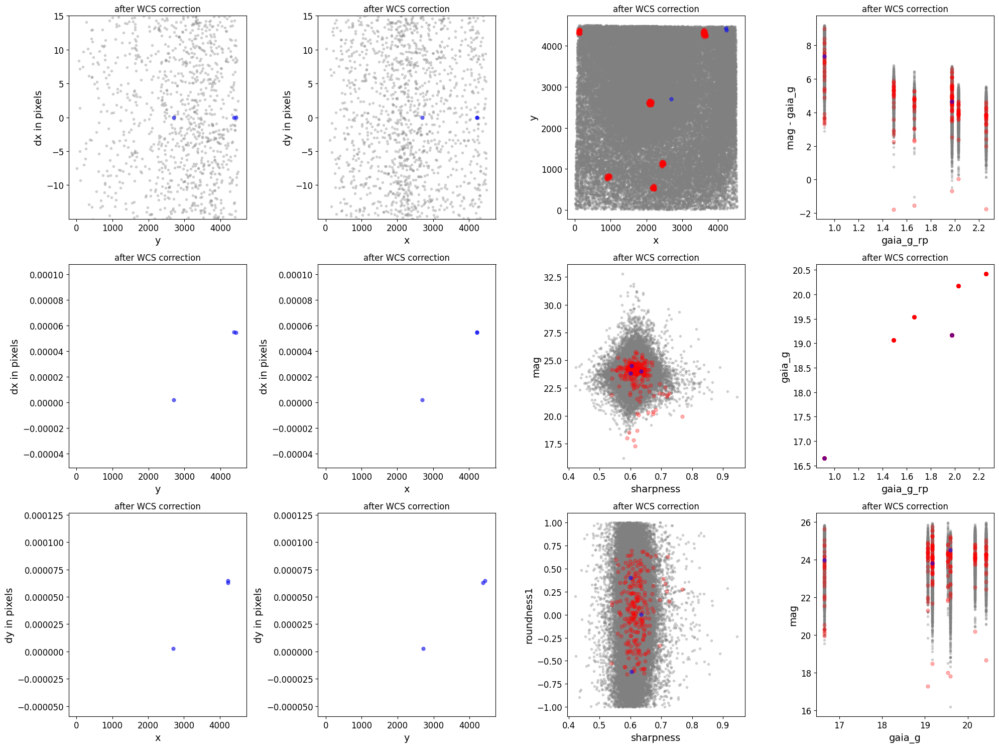

*** Note: close plots to continue!


2025-11-16 18:22:36,083 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of Gaia stars: 64


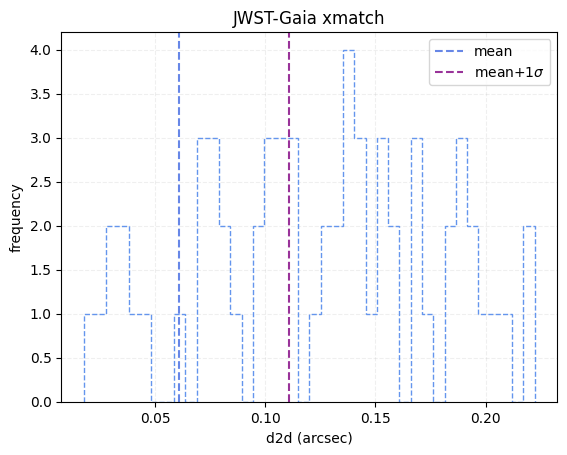

Initial mean dispersion: 60.96110836171163 mas
Initial median dispersion: 66.29647831021636 mas
0 data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_copy_jhat_i2d.phot.txt
No boolean mask filename provided.


2025-11-16 18:22:42,930 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-11-16 18:22:43,133 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-11-16 18:22:43,138 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-11-16 18:22:43,138 - stpipe - INFO - Instrument: NIRCAM
2025-11-16 18:22:43,138 - stpipe - INFO - Detector: MULTIPLE
2025-11-16 18:22:43,138 - stpipe - INFO - Filter: F200W
2025-11-16 18:22:43,139 - stpipe - INFO - Pupil: CLEAR
2025-11-16 18:22:43,139 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004


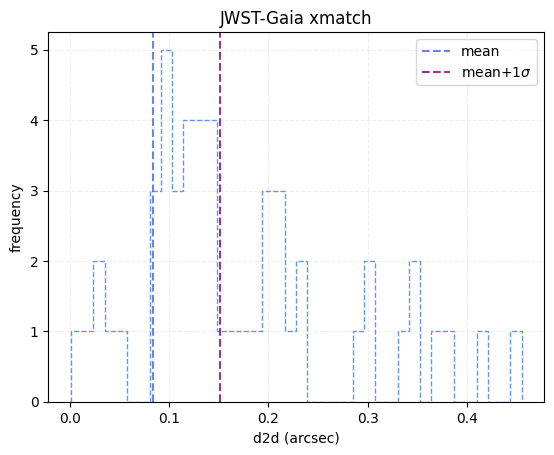

Final mean dispersion: 83.57013663908701 mas
Final median dispersion: 90.07584539290653 mas


2025-11-16 18:22:59,295 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of Gaia stars: 64
0 data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_copy_i2d.phot.txt
No boolean mask filename provided.


2025-11-16 18:23:05,839 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-11-16 18:23:06,004 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-11-16 18:23:06,009 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-11-16 18:23:06,009 - stpipe - INFO - Instrument: NIRCAM
2025-11-16 18:23:06,009 - stpipe - INFO - Detector: MULTIPLE
2025-11-16 18:23:06,010 - stpipe - INFO - Filter: F200W
2025-11-16 18:23:06,010 - stpipe - INFO - Pupil: CLEAR
2025-11-16 18:23:06,010 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004
Best guess for data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_copy_i2d.fits: (-22, 0)


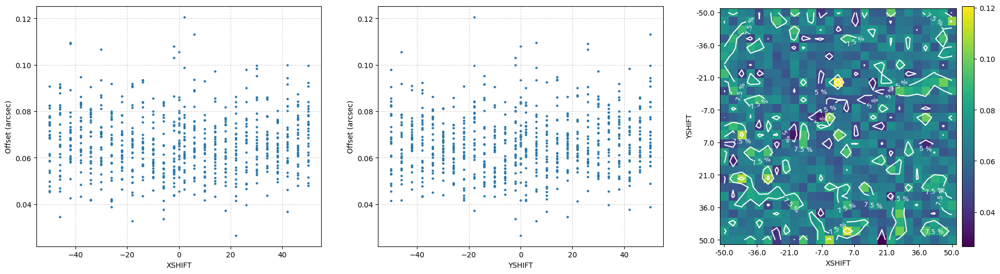

telescope set to jwst

### Doing photometry on data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_copy_i2d.fits
True ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy.phot.txt
photometry catalog filename: ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy.phot.txt
photcat ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy.phot.txt already exists, but recreating it since overwrite=True
Instrument: NIRCAM, aperture:NRCB1_FULL
Finding stars --- Detector: MULTIPLE, Filter: F200W
FWHM for the filter F200W: 2.141 px
No boolean mask filename provided.
Background and rms using MMMBackground and MADStdBackgroundRMS: 0.8730862 0.54643893


2025-11-16 18:24:27,578 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-11-16 18:24:27,742 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-11-16 18:24:27,747 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-11-16 18:24:27,747 - stpipe - INFO - Instrument: NIRCAM
2025-11-16 18:24:27,747 - stpipe - INFO - Detector: MULTIPLE
2025-11-16 18:24:27,748 - stpipe - INFO - Filter: F200W
2025-11-16 18:24:27,748 - stpipe - INFO - Pupil: CLEAR
2025-11-16 18:24:27,748 - stpipe - INFO - Subarray: FULL



Number of sources found in the image: 69202
-------------------------------------

radii:[np.float32(3.747)]pixels radius_sky_in:5.677999973297119 radius_sky_out:9.005000114440918  radius_for_mag:[np.float32(3.747)]
Performing aperture photometry for radius r = 3.746999979019165 px
Time Elapsed: 10.259101875009947
66700 objects left after removing entries with NaNs in mag or dmag column
dmag 0.36200000000000004
SNR_min cut: 66323 objects left after removing entries dmag>0.36200000000000004 (SNR<3)
66323 out of 66700 entries remain in photometry table
Saving ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy.phot.txt
########### !!!!!!!!!!  INITIAL CUT on image photometry cat: starting with 66700 objects
dmag_max =0.1 CUT:
dmag 0.1
64563 left
SHARPNESS =(0.3, 0.95) CUT:
sharpness 0.95
64563 left
roundness1=(-0.7, 0.7) CUT:
roundness1 0.7
58857 left
58857 of image photometry objects pass initial cuts #1, 7843 cut
Getting Gaia and matching it: ra=185.7453913863315 dec=15.8174903

2025-11-16 18:24:42,764 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of stars: 56
### Applying proper motion correction to epoch mjd=59961.46896008102
Number of stars after removing nan's: 14
########### !!!!!!!!!!  INITIAL CUT on reference catalog: starting with 14 objects
14 of image photometry objects pass initial cuts #1, 0 cut
Matching reference catalog Gaia
Using 58857 image objects that are in x_idl=[-31.20,107.44] and y_idl=[-31.09,107.56] range
x 4499
y 4478
Keeping 7 out of 14 catalog objects within x=40.0-4499 and y=40.0-4478
Keeping 7  after removing NaNs from ra/dec
!! Matching 58857 image objects to 7 refcat objects!
Saving refcat file into ./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy.refcat.txt
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 58857 objects
d2d =2.0 CUT using gaia_d2d:
gaia_d2d 2.0
249 left
249 of image photometry objects pass initial cuts #1, 58608 cut
dx median: -16.297328554231854
dy median: 3.0422940216503775
*** Note: close plot t

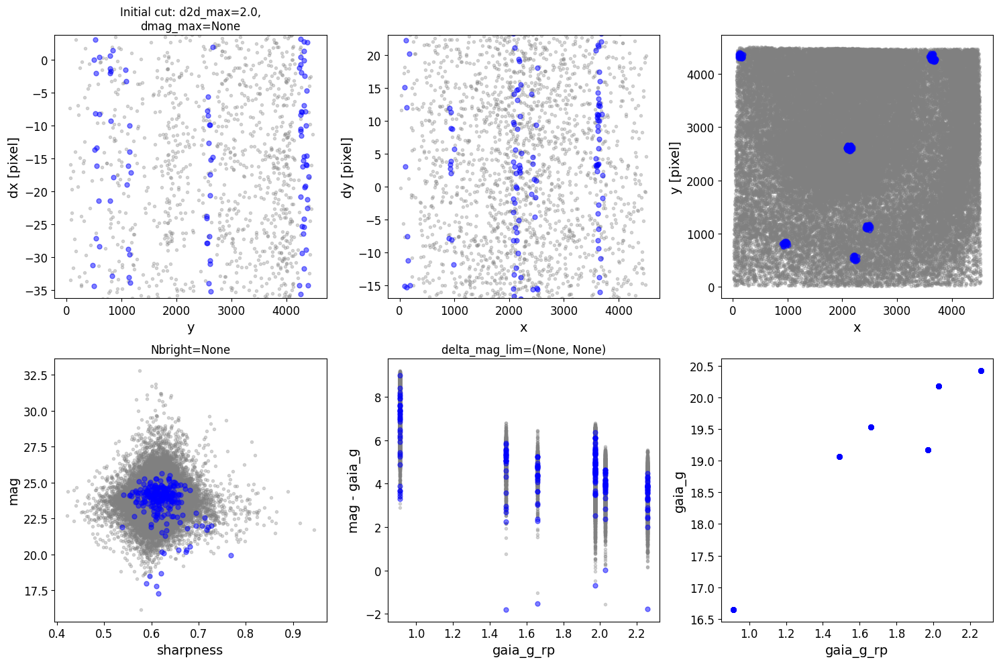

### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
   slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.00791  17.869043    57.0   1509  -589.178186  10.0     False
Setting rough_cut_px=25.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp -588.378186427931

rough_cut_px=0.8 pixels removes 58790 from 58857 entries
Keeping 67 out of 67, skippin 0 because of null values in columns d_rot_tmp
median: -589.103931
75.000000 percentile cut: max residual for cut: 0.404396
__tmp_residuals 0.4043959257122083
median: -589.103218
i:00 mean:-589.103218(0.030692) stdev:0.214845(0.021485) X2norm:0.99 Nchanged:0 

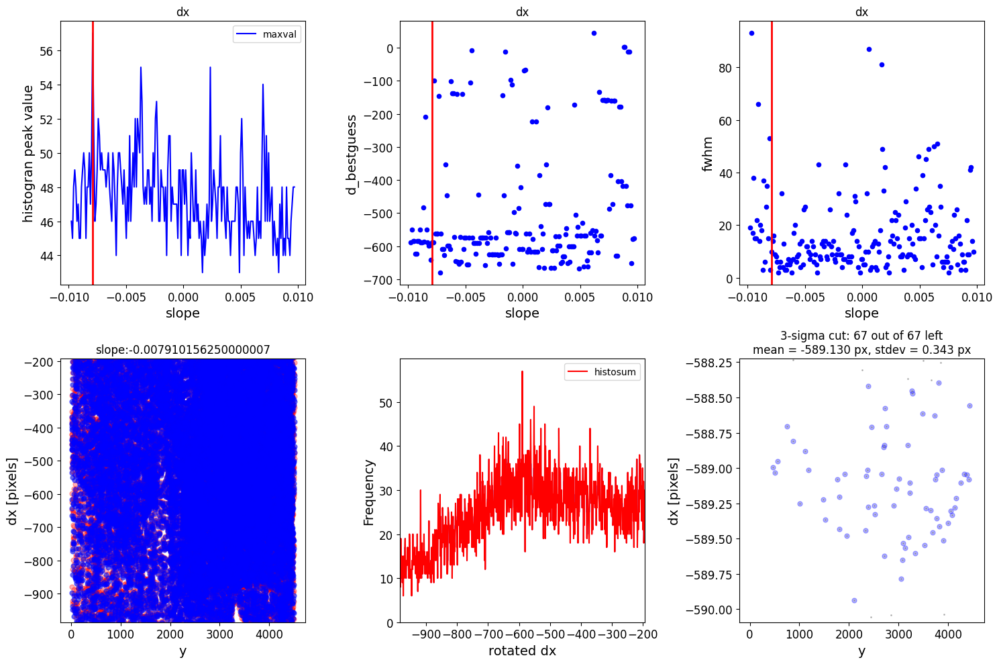

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.005078  11.524805     3.0    840   -93.238207   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp -92.43820717225363

rough_cut_px=0.8 pixels removes 64 from 67 entries
Keeping 3 out of 3, skippin 0 because of null values in columns d_rot_tmp
median: -93.220088
i:00 mean:-93.220088(0.332493) stdev:0.470215(0.191965) X2norm:0.79 Nchanged:0 Ngood:3 Nclip:0

mean: -93.200499
i:01 mean:-93.200499(0.294175) stdev:0.416026(0.169842) X2norm:1.00 Nchanged:0 Ngood:3

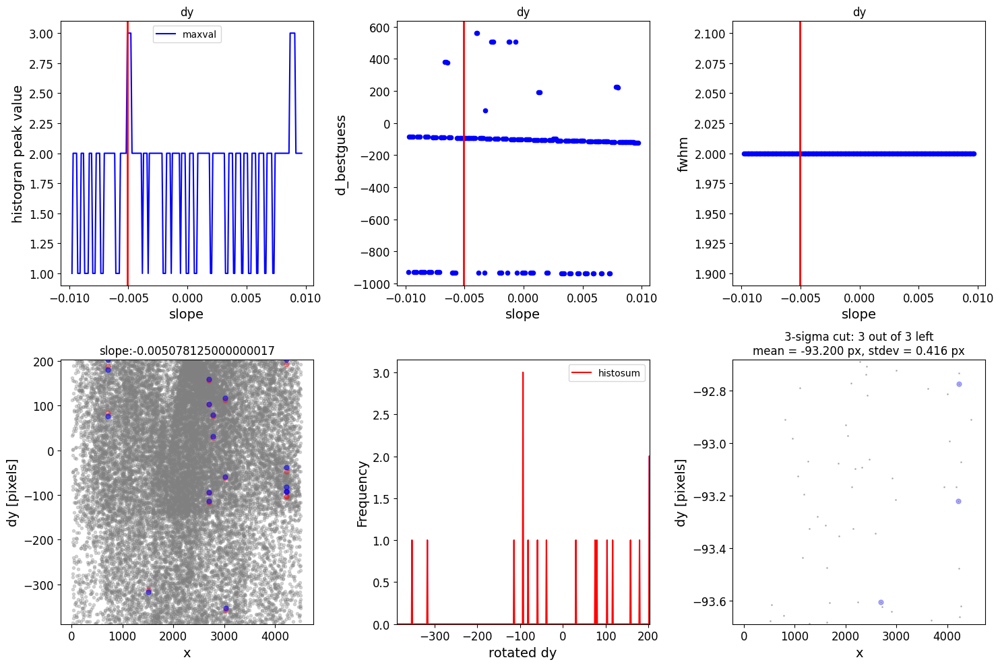

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2025-11-16 18:24:45,231 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.


3 matches are passed to tweakreg rshift fitting
Setting output directory for jw02107-o032_t014_nircam_clear-f200w_copy_jhat.fits file to ./data/sn2019ehk
Fitting tweakreg fitgeometry=general to xy=x,y to ra,dec=gaia_ra,gaia_dec


2025-11-16 18:24:45,642 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(4518, 4539) from jw02107-o032_t014_nircam_clear-f200w_copy_i2d.fits>],).
2025-11-16 18:24:45,644 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_copy_jhat.fits
  output_dir: ./data/sn2019ehk
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 3
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: general
  nclip: 3
  sigma: 3.0
  align_to_gaia: False
  gaia_catalog: GAIADR2
  min_gaia: 3
  save_gaia_catalog

WCSAXES 2 2
CRPIX1 2295.9397166813824 2295.9397166814
CRPIX2 2240.105846846746 2240.1058468467
PC1_1 -0.269904787463486 -0.2701969120386
PC1_2 -0.9628870160638217 -0.95645128708107
PC2_1 -0.9628870160638217 -0.95448383977875
PC2_2 0.269904787463486 0.2688232867737
CDELT1 8.54138455575943e-06 8.5413845557594e-06
CDELT2 8.54138455575943e-06 8.5413845557594e-06
CUNIT1 deg deg
CUNIT2 deg deg
CRVAL1 185.74548954281457 185.74770209981
CRVAL2 15.817229381931787 15.821855877829
MJD-BEG 59961.45181025463 59961.451810255
MJD-AVG 59961.46896008102 59961.468960081
MJD-END 59961.488098229165 59961.488098229
XPOSURE 1202.5199999999998 1202.52
TELAPSE 1202.5199999999998 1202.52
OBSGEO-X -392625199.82286525 -392625199.82287
OBSGEO-Y 1620561869.359983 1620561869.36
OBSGEO-Z 238509112.98875695 238509112.98876
RADESYS ICRS ICRS
VELOSYS -25738.49 -25738.49


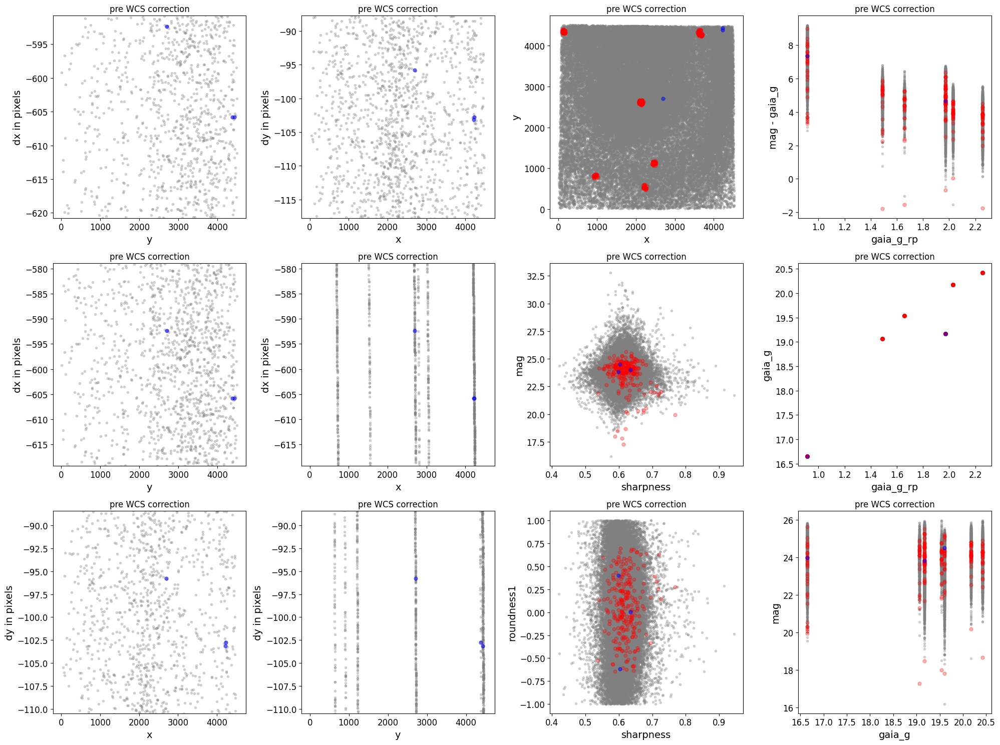

./data/sn2019ehk//jw02107-o032_t014_nircam_clear-f200w_copy_jhat.fits


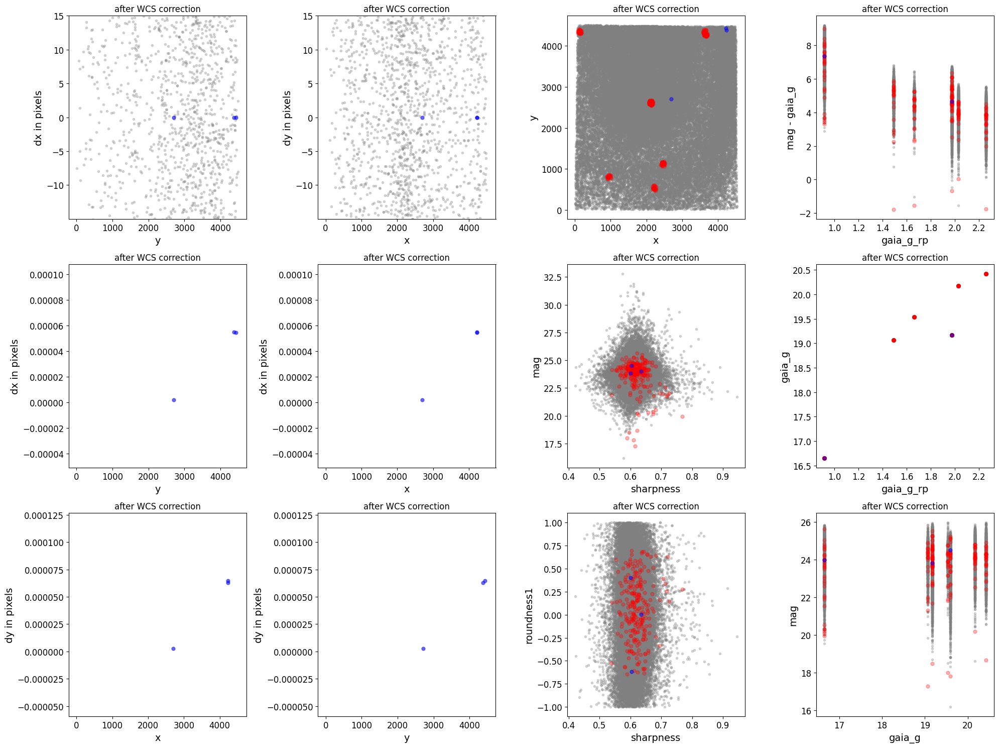

*** Note: close plots to continue!


2025-11-16 18:24:49,599 - stpipe - INFO - Query finished.


INFO: Query finished. [astroquery.utils.tap.core]
Number of Gaia stars: 64


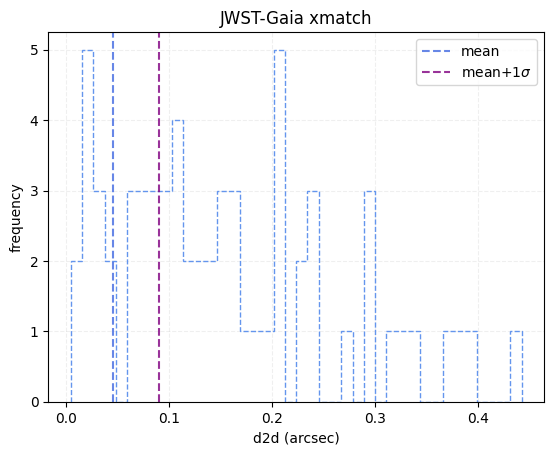

Initial mean dispersion: 46.10419806618778 mas
Initial median dispersion: 33.43318232375742 mas
0 data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_copy_jhat_i2d.phot.txt
No boolean mask filename provided.


2025-11-16 18:24:56,341 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-11-16 18:24:56,524 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-11-16 18:24:56,528 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-11-16 18:24:56,528 - stpipe - INFO - Instrument: NIRCAM
2025-11-16 18:24:56,528 - stpipe - INFO - Detector: MULTIPLE
2025-11-16 18:24:56,529 - stpipe - INFO - Filter: F200W
2025-11-16 18:24:56,529 - stpipe - INFO - Pupil: CLEAR
2025-11-16 18:24:56,529 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004


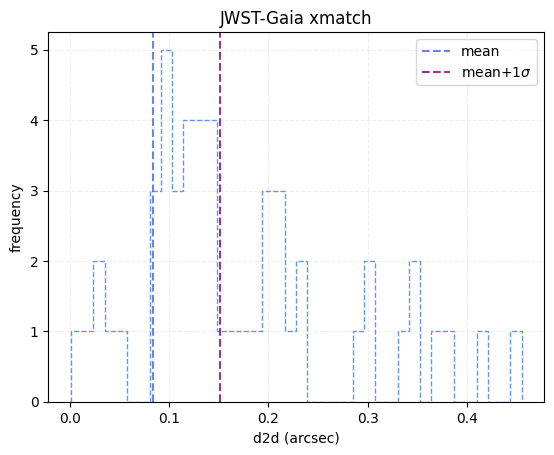

Final mean dispersion: 83.57013663908701 mas
Final median dispersion: 90.07584539290653 mas
Final Gaia dispersion for data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_copy_i2d.fits: 83.57013663908701 mas
Copying unaligned data/sn2019ehk/jw02107-o032_t014_nircam_clear-f200w_copy_i2d.fits to output, redo alignment


(0, 0)

In [25]:
jwst123.align_jwst_image(image, outdir, True, None, 0, 0, 800, 2, True, True)

In [9]:
t = Table.read('./data/sn2019ehk//jw02107043001_02101_00001_nrcb1.goodmatches.csv')

### SN2025qgd

In [32]:
outdir = 'data/sn2025qgd'
ref_image = glob.glob(os.path.join(outdir, 'wfc3.f555w.drz.fits'))[0]

with fits.open(ref_image, mode='update') as hdul:
    primary_hdu = hdul['PRIMARY']
    new_hdu = fits.ImageHDU(data=primary_hdu.data, header=primary_hdu.header)
    new_hdu.header['EXTNAME'] = 'SCI'
    hdul.append(new_hdu)
    hdul.flush()

photfilename = jwst123.fix_phot(ref_image, telescope='hst')

0 data/sn2025qgd/wfc3.f555w.drz.phot.txt
No boolean mask filename provided.
dmag 0.36200000000000004


In [33]:
align_image = glob.glob(os.path.join(outdir, 'f150w_i2d.fits'))[0]
align_photfile = jwst123.fix_phot(align_image, telescope='jwst')

0 data/sn2025qgd/f150w_i2d.phot.txt
No boolean mask filename provided.


2025-12-03 22:35:49,132 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-12-03 22:35:50,737 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-12-03 22:35:50,741 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-12-03 22:35:50,741 - stpipe - INFO - Instrument: NIRCAM
2025-12-03 22:35:50,741 - stpipe - INFO - Detector: MULTIPLE
2025-12-03 22:35:50,742 - stpipe - INFO - Filter: F150W
2025-12-03 22:35:50,742 - stpipe - INFO - Pupil: CLEAR
2025-12-03 22:35:50,742 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004


Aligning f150w_i2d.fits to data/sn2025qgd/wfc3.f555w.drz.corr.fits
telescope set to jwst

### Doing photometry on data/sn2025qgd/f150w_i2d.fits
True ./data/sn2025qgd//f150w.phot.txt
photometry catalog filename: ./data/sn2025qgd//f150w.phot.txt
Instrument: NIRCAM, aperture:NRCB2_FULL
Finding stars --- Detector: MULTIPLE, Filter: F150W
FWHM for the filter F150W: 1.77 px
No boolean mask filename provided.
Background and rms using MMMBackground and MADStdBackgroundRMS: 0.251014 0.14880118


2025-12-03 22:40:25,329 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-12-03 22:40:25,496 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-12-03 22:40:25,500 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-12-03 22:40:25,500 - stpipe - INFO - Instrument: NIRCAM
2025-12-03 22:40:25,500 - stpipe - INFO - Detector: MULTIPLE
2025-12-03 22:40:25,500 - stpipe - INFO - Filter: F150W
2025-12-03 22:40:25,501 - stpipe - INFO - Pupil: CLEAR
2025-12-03 22:40:25,501 - stpipe - INFO - Subarray: FULL



Number of sources found in the image: 28601
-------------------------------------

radii:[np.float32(3.199)]pixels radius_sky_in:6.081999778747559 radius_sky_out:9.496000289916992  radius_for_mag:[np.float32(3.199)]
Performing aperture photometry for radius r = 3.1989998817443848 px
Time Elapsed: 3.7977245419751853
24376 objects left after removing entries with NaNs in mag or dmag column
dmag 0.2172
SNR_min cut: 22079 objects left after removing entries dmag>0.2172 (SNR<5)
22079 out of 24376 entries remain in photometry table
Saving ./data/sn2025qgd//f150w.phot.txt
########### !!!!!!!!!!  INITIAL CUT on image photometry cat: starting with 24376 objects
dmag_max =0.1 CUT:
dmag 0.1
16938 left
SHARPNESS =(0.3, 0.95) CUT:
sharpness 0.95
16907 left
roundness1=(-0.7, 0.7) CUT:
roundness1 0.7
14112 left
objmag_lim=(15, 25) CUT:
mag 25
11613 left
Nbright=800 CUT:
800 left
800 of image photometry objects pass initial cuts #1, 23576 cut
Getting data/sn2025qgd/wfc3.f555w.drz.corr.phot.txt and ma

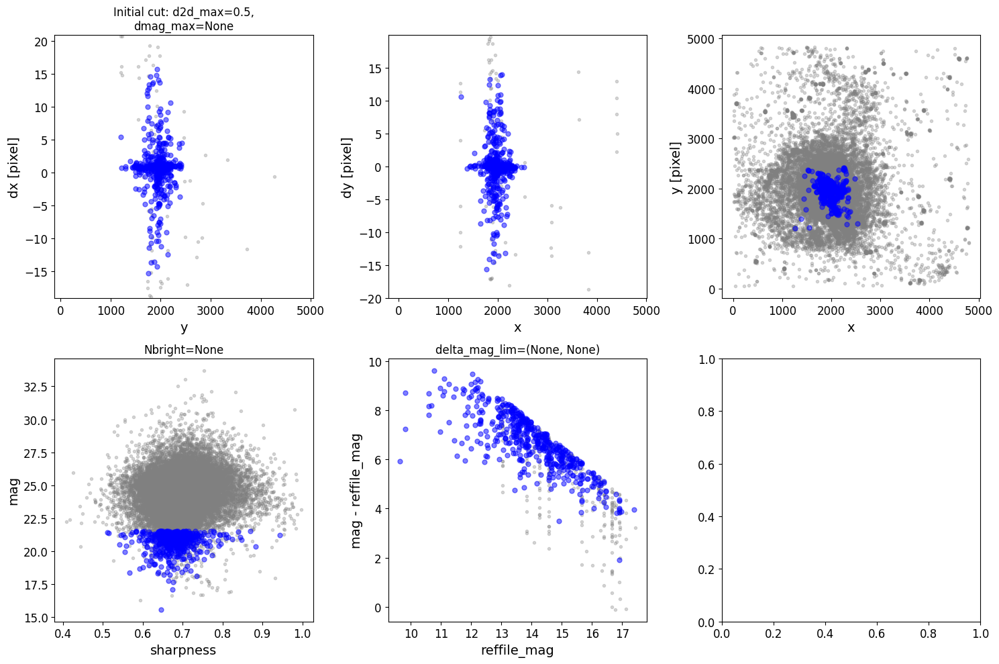

### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
   slope  intercept  maxval  index  d_bestguess  fwhm  multimax
0.000293  -0.710742   242.0   2303     1.104487   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 1.9044868689123178

rough_cut_px=0.8 pixels removes 524 from 800 entries
Keeping 276 out of 276, skippin 0 because of null values in columns d_rot_tmp
median: 1.055173
75.000000 percentile cut: max residual for cut: 0.350804
__tmp_residuals 0.3508043001140959
median: 1.056987
i:00 mean:1.056987(0.011733) stdev:0.168396(0.008276) X2norm:1.00 Nchanged:0 Ngood:207 N

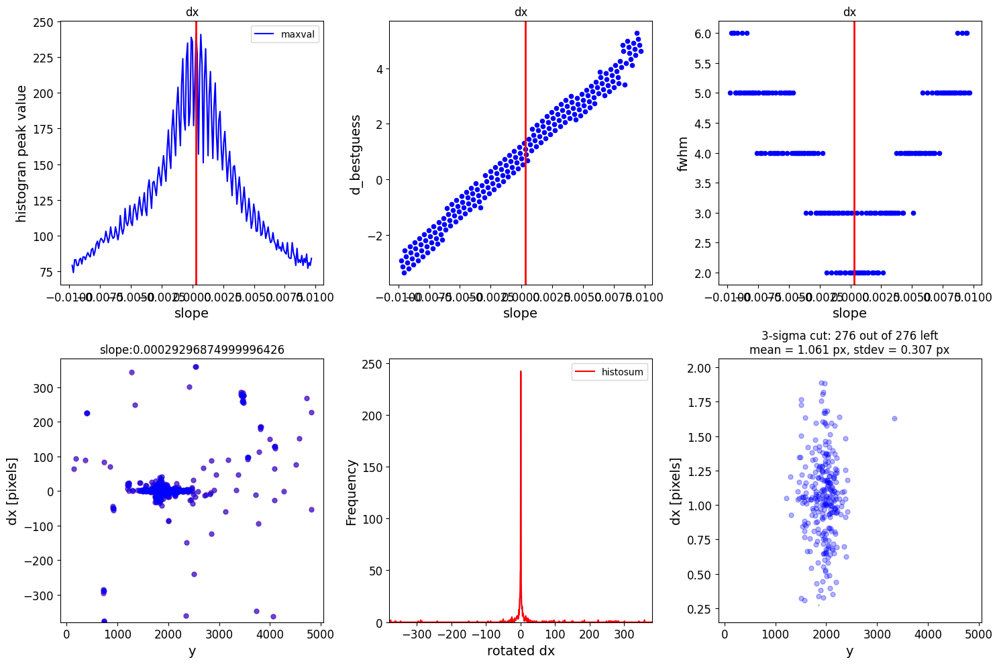

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000781   1.880078   186.0    916    -0.497141   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 0.30285859861992326

rough_cut_px=0.8 pixels removes 58 from 276 entries
Keeping 218 out of 218, skippin 0 because of null values in columns d_rot_tmp
median: -0.319093
75.000000 percentile cut: max residual for cut: 0.321319
__tmp_residuals 0.32131872475240747
median: -0.314754
i:00 mean:-0.314754(0.013420) stdev:0.170805(0.009460) X2norm:1.00 Nchanged:0 Ngood

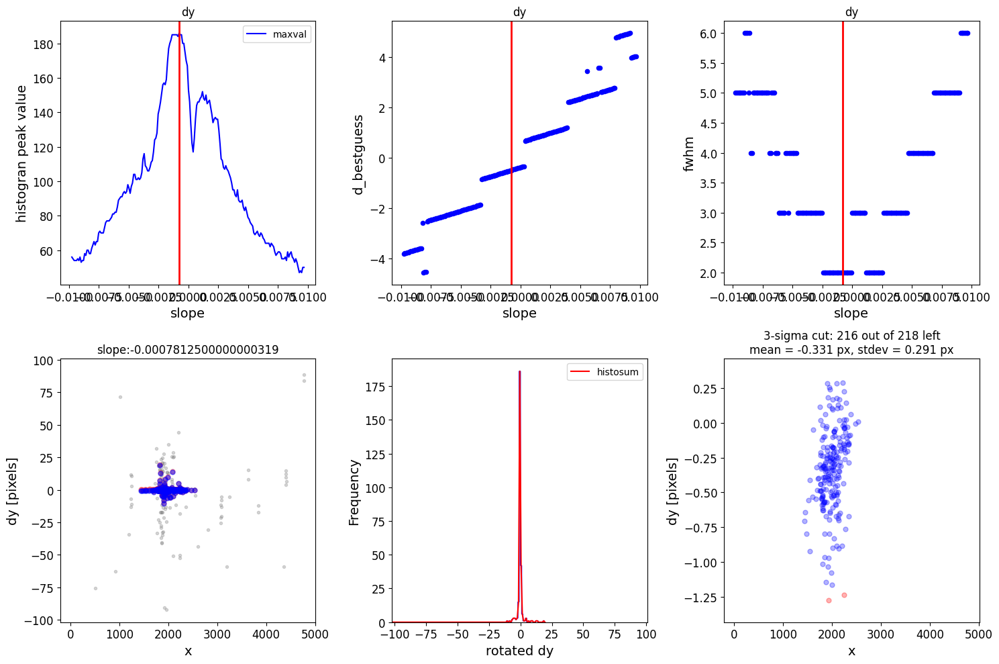

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

dx median of best matched objects of 1st iteration: 0.908039432210785 dy median of best matched objects of 1st iteration: 0.0057713365041536235
Matching reference catalog data/sn2025qgd/wfc3.f555w.drz.corr.phot.txt
Using 800 image objects that are in x_idl=[-30.42,115.48] and y_idl=[-28.16,116.38] range
x 4773
y 4812
Keeping 1303 out of 1303 catalog objects within x=40.0-4773 and y=40.0-4812
Keeping 1303  after removing NaNs from ra/dec
!! Matching 800 image objects to 1303 refcat objects!
########### !!!!!!!!!!  INITIAL CUT on matched cat: starting with 800 objects
d2d =0.5 CUT using reffile_d2d:
reffile_d2d 0.5
505 left
505 of image photometry objects pass initial cuts #1, 295 cut
### Doing histogram cut for dx, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dx versus y
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize

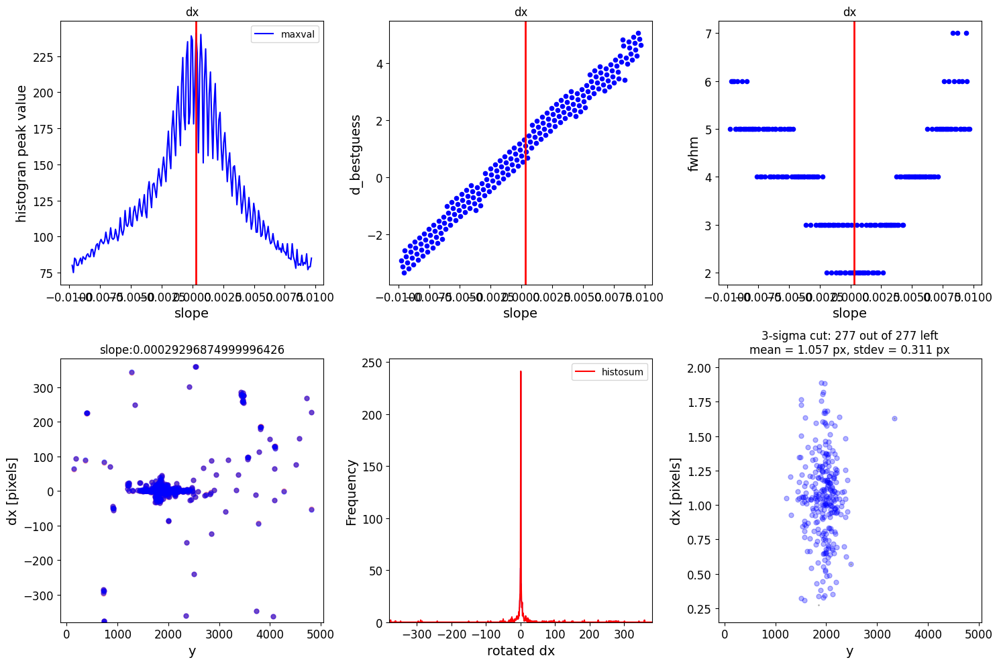

### Doing histogram cut for dy, slope_min:-0.009766 slope_max:0.009766 slope_stepsize:0.000098
Nfwhm=2.5, rough_cut_px_min=0.3, rough_cut_px_max=0.8, Nsigma=3.0
########################
### rotate dy versus x
Applying rolling gaussian:
gaussian_sigma_px=0.2, binsize=1.0, gaussian_sigma(bins)=0.2, windowsize(bins)=1 halfwindowsize(bins)=1
####BEST:
    slope  intercept  maxval  index  d_bestguess  fwhm  multimax
-0.000781   1.880078   186.0    916    -0.497141   2.0     False
Setting rough_cut_px=5.0. limits: (0.3-0.8)
Setting rough_cut_px=0.8

####################
### d_rotated cut (rough_cut_px=0.8 pixels, Nsigma=3.0)
d_rot_tmp 0.30285859861992326

rough_cut_px=0.8 pixels removes 59 from 277 entries
Keeping 218 out of 218, skippin 0 because of null values in columns d_rot_tmp
median: -0.319093
75.000000 percentile cut: max residual for cut: 0.321319
__tmp_residuals 0.32131872475240747
median: -0.314754
i:00 mean:-0.314754(0.013420) stdev:0.170805(0.009460) X2norm:1.00 Nchanged:0 Ngood

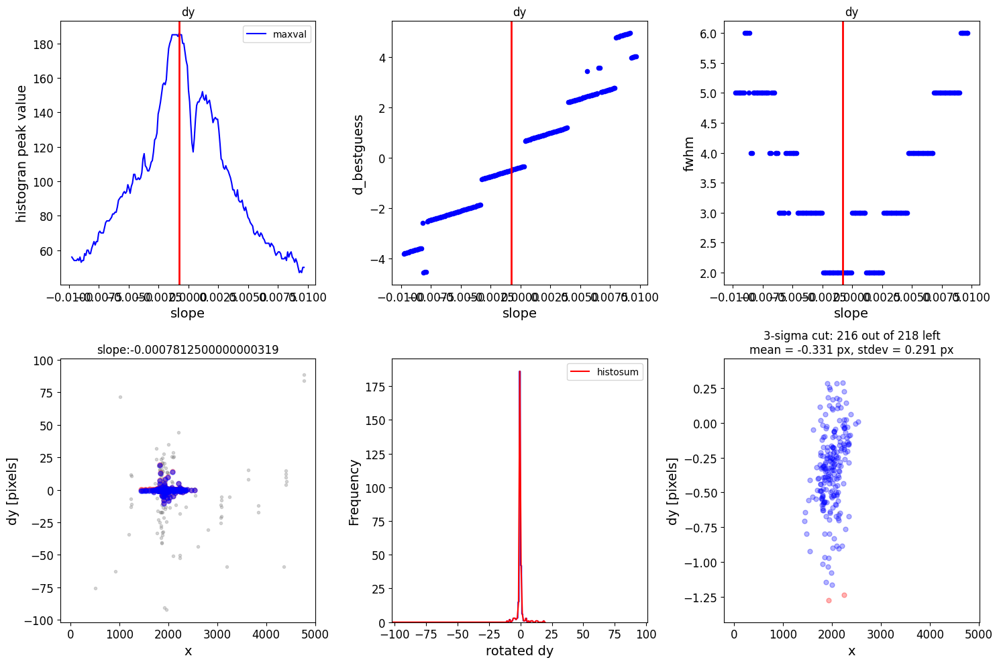

*** Note: close plots to continue!


<Figure size 640x480 with 0 Axes>

2025-12-03 22:40:33,198 - stpipe.TweakRegStep - INFO - TweakRegStep instance created.


216 matches are passed to tweakreg rshift fitting


2025-12-03 22:40:33,523 - stpipe.TweakRegStep - INFO - Step TweakRegStep running with args ([<ImageModel(4852, 4813) from f150w_i2d.fits>],).
2025-12-03 22:40:33,525 - stpipe.TweakRegStep - INFO - Step TweakRegStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: /Users/aswin/jwst123/data/sn2025qgd/f150w_jhat.fits
  output_dir: ./data/sn2025qgd
  output_ext: .fits
  output_use_model: True
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_catalogs: False
  catalog_format: ecsv
  kernel_fwhm: 2.5
  snr_threshold: 50
  brightest: 4000
  peakmax: None
  enforce_user_order: False
  expand_refcat: False
  minobj: 3
  searchrad: 0.5
  use2dhist: True
  separation: 9
  tolerance: 0.7
  xoffset: 0
  yoffset: 0
  fitgeometry: general
  nclip: 3
  sigma: 3.0
  align_to_gaia: False
  gaia_catalog: GAIADR2
  min_gaia: 3
  save_gaia_catalog: False
  telescope: jwst
2025-12-03 22:40:33,528 - stpipe.TweakRegStep 

Setting output directory for f150w_jhat.fits file to ./data/sn2025qgd
Fitting tweakreg fitgeometry=general to xy=x,y to ra,dec=reffile_ra,reffile_dec


2025-12-03 22:40:33,819 - stpipe.TweakRegStep - INFO - No matching of sources from 'GROUP ID: f150w_i2d' catalog with sources from the reference 'Unnamed' catalog was requested.
2025-12-03 22:40:33,819 - stpipe.TweakRegStep - INFO - Catalogs are assumed matched with 1-to-1 correspondence.
2025-12-03 22:40:33,820 - stpipe.TweakRegStep - INFO - Found 216 matches for 'GROUP ID: f150w_i2d'...
2025-12-03 22:40:33,820 - stpipe.TweakRegStep - INFO - Performing 'general' fit
2025-12-03 22:40:33,821 - stpipe.TweakRegStep - INFO - Computed 'general' fit for GROUP ID: f150w_i2d:
2025-12-03 22:40:33,821 - stpipe.TweakRegStep - INFO - XSH: 0.491813  YSH: 0.0651894    PROPER ROT: 0.0129015    
2025-12-03 22:40:33,821 - stpipe.TweakRegStep - INFO - <ROT>: 0.0129015  SKEW: 0.00032162    ROT_X: 0.0127407  ROT_Y: 0.0130623
2025-12-03 22:40:33,821 - stpipe.TweakRegStep - INFO - <SCALE>: 1.00009  SCALE_X: 0.999995  SCALE_Y: 1.00019
2025-12-03 22:40:33,821 - stpipe.TweakRegStep - INFO - 
2025-12-03 22:40:3

WCSAXES 2 2
CRPIX1 2283.8073494319 2283.8073494319
CRPIX2 2298.3663581987 2298.3663581987
PC1_1 0.80352033730765 0.80364838954941
PC1_2 -0.59527730305547 -0.59520794856435
PC2_1 0.59527730305547 0.59509557285357
PC2_2 0.80352033730765 0.80380958225344
CDELT1 -8.499058317297e-06 -8.499058317297e-06
CDELT2 8.499058317297e-06 8.499058317297e-06
CUNIT1 deg deg
CUNIT2 deg deg
CRVAL1 156.96264489841 156.96263536321
CRVAL2 -43.89989842318901 -43.899893368484
MJD-BEG 59938.66242150463 59938.662421505
MJD-AVG 59940.43857103896 59940.438571039
MJD-END 59940.88705172454 59940.887051725
XPOSURE 621.5820000000001 621.582
TELAPSE 690.258 690.258
OBSGEO-X -296521631.4373586 -296521631.43736
OBSGEO-Y 1649351544.58424 1649351544.5842
OBSGEO-Z 235249993.68190807 235249993.68191
RADESYS ICRS ICRS
VELOSYS -20086.13 -20086.13


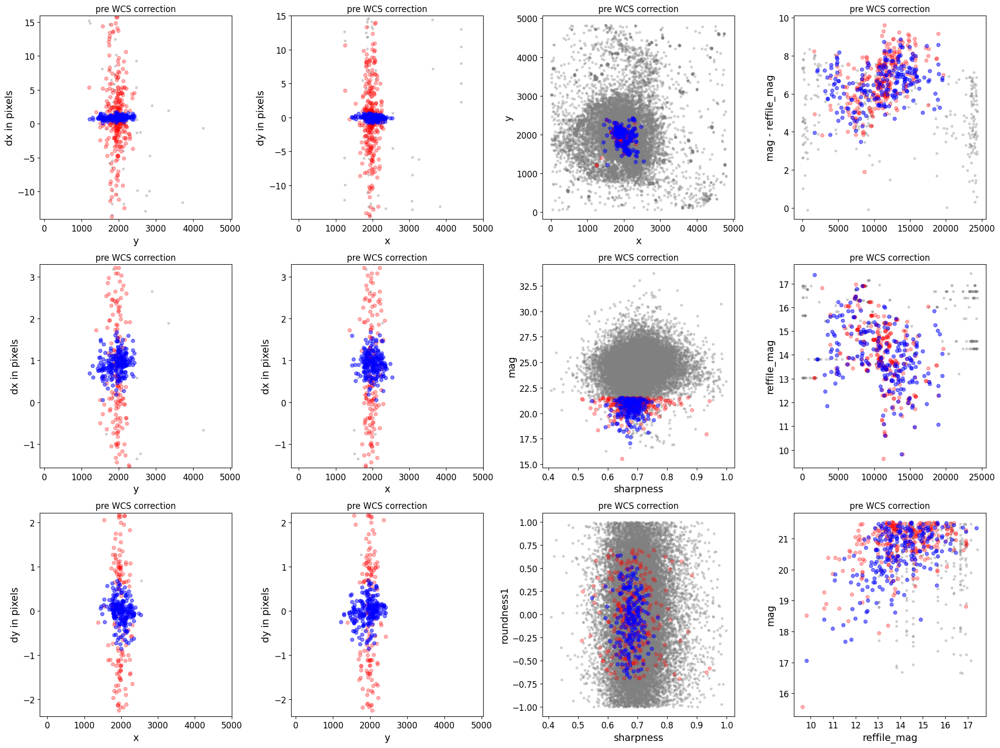

./data/sn2025qgd//f150w_jhat.fits


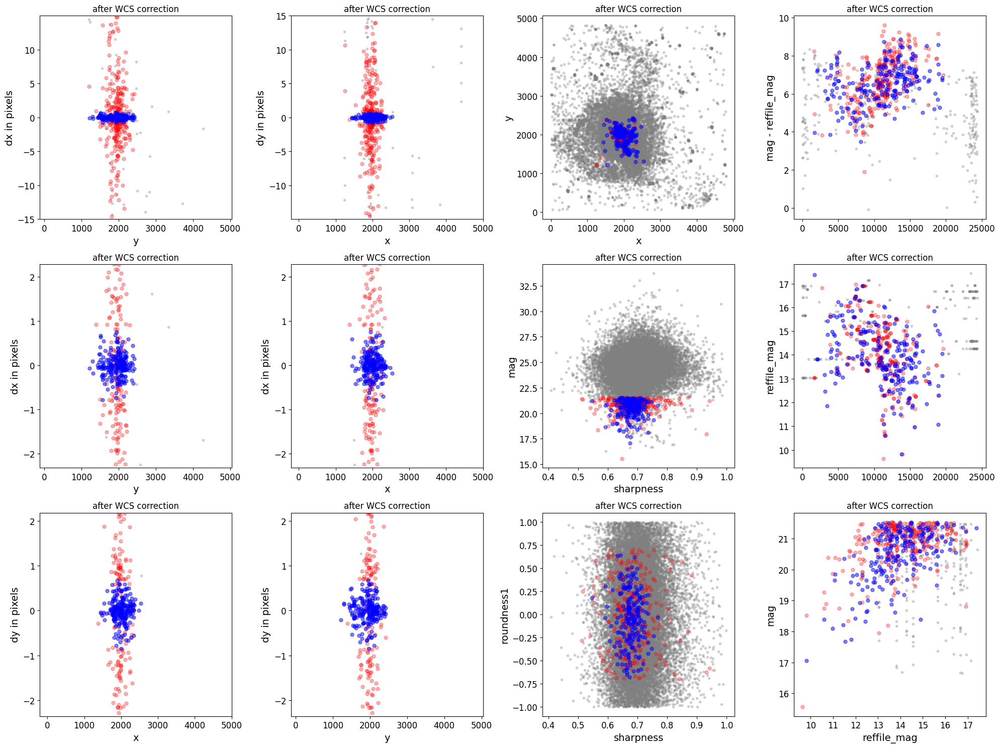

*** Note: close plots to continue!


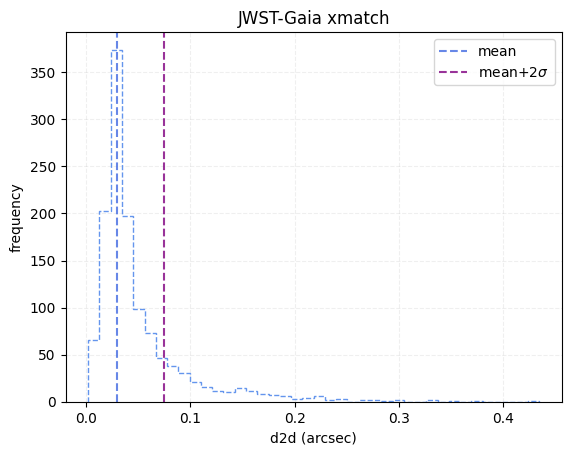

Initial mean dispersion: 29.275249702604885 mas
Initial median dispersion: 27.67785551094562 mas
0 data/sn2025qgd/f150w_jhat_i2d.phot.txt
No boolean mask filename provided.


2025-12-03 22:40:42,340 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.
2025-12-03 22:40:42,677 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_apcorr_0004.fits
2025-12-03 22:40:42,680 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: /Users/aswin/data/crds_cache/references/jwst/nircam/jwst_nircam_abvegaoffset_0002.asdf
2025-12-03 22:40:42,681 - stpipe - INFO - Instrument: NIRCAM
2025-12-03 22:40:42,681 - stpipe - INFO - Detector: MULTIPLE
2025-12-03 22:40:42,681 - stpipe - INFO - Filter: F150W
2025-12-03 22:40:42,681 - stpipe - INFO - Pupil: CLEAR
2025-12-03 22:40:42,681 - stpipe - INFO - Subarray: FULL


dmag 0.36200000000000004


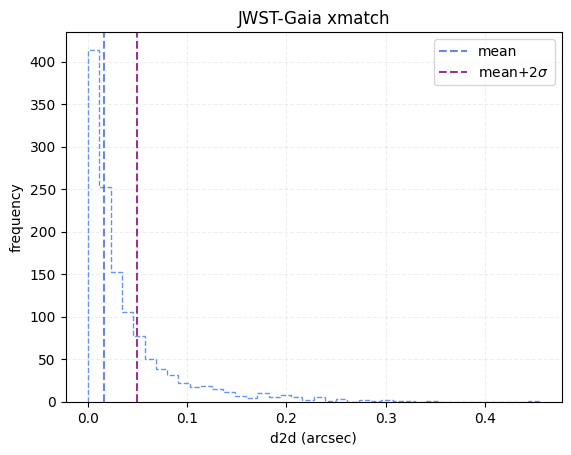

Final mean dispersion: 15.997708013905724 mas
Final median dispersion: 11.42011959424181 mas
Final JWST dispersion for data/sn2025qgd/f150w_i2d.fits: 11.42011959424181 mas


(0, 0)

In [35]:
jwst123.align_jwst_image(align_image=align_image, outdir=outdir, gaia=False, 
                         plot=True, verbose=True, photfilename=photfilename, Nbright=800)

### SN2025qgd

In [14]:
hdul = fits.open('data/sn2025qgd/diff.fits')
data = hdul[0].data

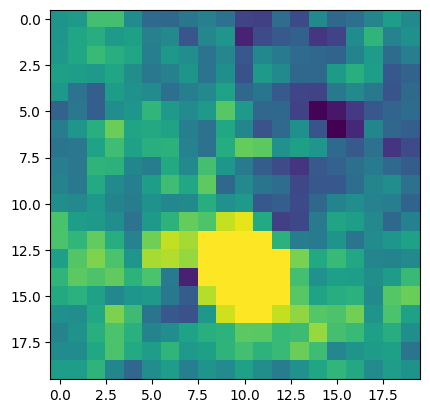

In [25]:
_, med, sig = scs(data[2595:2615, 2590:2610])
plt.imshow(data[2595:2615, 2590:2610], vmin = med-3*sig, vmax=med+3*sig)

In [26]:
x4, y4 = centroid_2dg(data[2595:2615, 2590:2610])

In [27]:
x4, y4

(np.float64(10.036280067466816), np.float64(13.961458850080406))

In [36]:
cent = (2590+10.036280067466816, 2595+13.961458850080406)

In [37]:
w = wcs.WCS(hdul[0].header)

In [38]:
w.all_pix2world(*cent, 0)

[array(156.96276673), array(-43.90571709)]

In [41]:
c1 = SkyCoord(ra = 156.96276673, dec=-43.90571709, frame='icrs', unit=u.deg)
c2 = SkyCoord(ra = 156.962791, dec=-43.905705, frame='icrs', unit=u.deg)

In [42]:
c1.separation(c2)

<Angle 2.12586858e-05 deg>